# I. Set Up

In [1]:
# PYTHON Imports 
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import math
import statistics
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D
from pathlib import Path
import glob
import os
import ipywidgets as widgets
from IPython.display import clear_output
import sys
import time
import json
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
import umap
import seaborn as sns
import fnmatch
# ASTROPHY Imports
import astropy 
from astropy.table import Table
from astropy.io import fits
from sherpa.astro import ui
# CIAO Imports
import ciao_contrib.runtool
from ciao_contrib.runtool import *
# CUSTOM Imports
from data_extraction_functions import *
from data_exploration_functions import *
from data_representation_functions import *

# Specify global path
global_path = '/Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets'
global_folders = list_folders_fun(global_path)

# Custom object hook to convert lists of lists to NumPy arrays
def numpy_hook(obj):
    if isinstance(obj, list):
        # Check if the list contains sublists (i.e. a matrix)
        if isinstance(obj[0], list):
            # Convert the list of lists to a NumPy array matrix
            return np.array(obj)
    # Return all other objects as is
    return obj

# Select dataset
set_widget = widgets.Dropdown(options=global_folders[:],value=global_folders[0],description='Set :',disabled=False); set_widget

2023-04-30 12:22:53.310547: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Dropdown(description='Set :', options=('Full', 'All', 'Full_extra', 'New', 'Bona'), value='Full')

# II. Load Data

In [2]:
# Set ID
set_id = set_widget.value
files = os.listdir(f'{global_path}/{set_id}/')
input_files = [f for f in files if fnmatch.fnmatch(f, 'hist*nE16*none*.pkl')]
input_widget = widgets.Dropdown(options=input_files[:],value=input_files[0],description='Histogram File :',disabled=False); input_widget

Dropdown(description='Histogram File :', options=('hist2D-Full-nE16-nt24-normnone.pkl', 'hist3D-Full-nE16-nt24…

In [17]:
# Load the DataFrame from the CSV file
input_file = input_widget.value
# Load histogram dictionary
with open(f'{global_path}/{set_id}/{input_file}', 'rb') as f:
    hist_dict = pickle.load(f)
# Flatten histograms in the dictionary and get IDs
ids = hist_dict.keys()
histograms = hist_dict.values()
features = np.array([np.array(h).flatten() for h in histograms])
features[np.isnan(features)] = 0.0
# Load properties
df_properties_input = pd.read_csv(f'{global_path}/{set_id}/properties-input-{set_id}.csv')
df_properties_input = df_properties_input[df_properties_input['obsreg_id'].isin(list(ids))]
df_properties = df_properties_input.drop_duplicates('obsreg_id', keep='first').reset_index()
#Load eventfiles
df_eventfiles_input = pd.read_csv(f'{global_path}/{set_id}/eventfiles-input-{set_id}.csv')
df_properties_global = pd.read_csv(f'{global_path}/{set_id}/properties-{set_id}.csv')
df_properties_global['obsreg_id'] = df_properties_global['obsid'].astype(str) + '_' + df_properties_global['region_id'].astype(str)
df_eventfiles_group = df_eventfiles_input.groupby('obsreg_id')
df_properties_group = df_properties_input.groupby('obsreg_id')

# print("Number of Eventfiles: ", df_eventfiles_group.ngroups)
# print("Number of Property Sets: ", df_properties_group.ngroups)

# Print eventfiles and properties number of IDs
print("Number of Features: ", len(features))
print("Number of Property Sets: ", len(df_properties))
print("Number of Full Property Sets: ", len(df_properties_global))

Number of Features:  95473
Number of Property Sets:  95473
Number of Full Property Sets:  130232


# III. Display

SHOW

In [4]:
# Load DBSCAN RESULT
files = os.listdir(f'{global_path}/{set_id}/')
dbscan_files = [f for f in files if fnmatch.fnmatch(f, 'DBSCANres*11*EPS2.1*MS22*csv')]
dbscan_files = [f for f in files if fnmatch.fnmatch(f, 'DBSCANres*11*EPS1.65*MS28*csv')]
dbscan_widget = widgets.Dropdown(options=dbscan_files[:],value=dbscan_files[0],description='TSNE File :',disabled=False); dbscan_widget

Dropdown(description='TSNE File :', options=('DBSCANres-Full-tsne-Full-hist3D-Full-nE16-nt24-ndt16-normnone-2D…

In [5]:
# Load the DataFrame from the CSV file
dbscan_file = dbscan_widget.value
df_tsne = pd.read_csv(f'{global_path}/{set_id}/{dbscan_file}')
df_tsne = df_tsne.sort_values(by='cluster', ascending=True) 

#####SELECTED ANOMALIES
flares_maybe = ['10542_331','10556_6687','10556_5752','10556_6687']
dips_maybe = ['13814_586','13813_218','13828_596']

# DIPS ET AL
parmar = ['10783_10','10871_10','11059_10','9070_10','9072_10'] # LMXB dips!
distefano = ['13814_567']
m101ulx = ['4736_81','6170_74','4733_229','4737_74','5300_95','5322_229','6152_81']

ieva = ['11272_13','13812_586','13812_218','9550_17','942_101','6152_79']

# FLARES ET AL 
lin = ['4062_31', '13454_56','20635_58'] 
xue = ['957_208', '3389_274','15211_38','15214_29']
irwin = ['3926_13','7800_4','7799_16','8490_30']
glennie = ['12884_10']
jonker = ['803_90']
vasquez = ['2025_39','9546_17','9548_14','12264_54','15113_59']
vasquez = ['2025_39','9548_14','15113_59']
nandra = ['9875_166', '9456_274', '5849_62']
goulding =['8636_2', '8636_3'] # last one not listed 2012 2015

flares = ['4395_992','16444_1025','13637_1078','14368_489','14368_503','10822_185','10955_21','10996_5','2833_53','13610_112','15214_29','1042_24']

tsne_lin = df_tsne.loc[df_tsne['obsreg_id'].isin(lin)]
tsne_irwin = df_tsne.loc[df_tsne['obsreg_id'].isin(irwin)]
tsne_glennie = df_tsne.loc[df_tsne['obsreg_id'].isin(glennie)]
tsne_jonker = df_tsne.loc[df_tsne['obsreg_id'].isin(jonker)]
tsne_vasquez = df_tsne.loc[df_tsne['obsreg_id'].isin(vasquez)]
tsne_xue = df_tsne.loc[df_tsne['obsreg_id'].isin(xue)]
tsne_goulding = df_tsne.loc[df_tsne['obsreg_id'].isin(goulding)]
tsne_nandra = df_tsne.loc[df_tsne['obsreg_id'].isin(nandra)]
tsne_flares = df_tsne.loc[df_tsne['obsreg_id'].isin(flares + flares_maybe)]

tsne_m101ulx = df_tsne.loc[df_tsne['obsreg_id'].isin(m101ulx)]
tsne_distefano = df_tsne.loc[df_tsne['obsreg_id'].isin(distefano)]
tsne_moredips = df_tsne.loc[df_tsne['obsreg_id'].isin(ieva + dips_maybe)]
tsne_parmar = df_tsne.loc[df_tsne['obsreg_id'].isin(parmar)] # LMXB


anomalies = pd.concat([tsne_lin,tsne_irwin,tsne_glennie,tsne_jonker,tsne_vasquez,tsne_xue,tsne_goulding,tsne_nandra,tsne_flares,tsne_m101ulx, tsne_distefano, tsne_moredips,tsne_parmar])
anomalies.head(50)

,tsne1,tsne2,obsreg_id,cluster
45857,-63.425117,-46.655674,20635_58,3
14036,-64.057760,-52.673847,13454_56,9
63365,-71.433790,-9.262391,4062_31,10
10836,-82.181230,-31.629532,12884_10,23
86304,-76.826416,-27.031042,803_90,5
92694,-64.759636,-0.543161,9548_14,2
44094,-66.567635,-47.735123,2025_39,3
23967,-67.336426,-36.994038,15113_59,13
93047,-58.404457,0.549050,957_208,2
59286,-67.557780,-27.232270,3389_274,16


[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27]


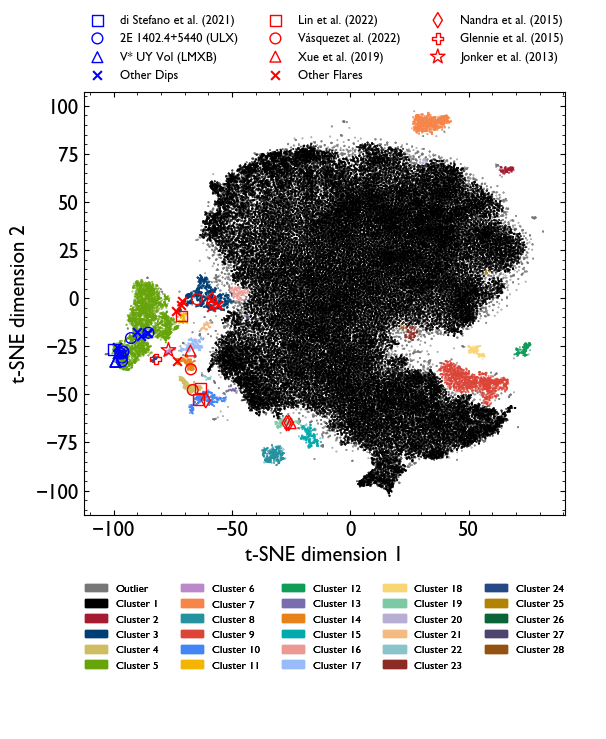

In [10]:
# PLOT
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

imperial = '#003E74'
harvard = '#A51C30'
silver = '#777777'
gold = '#cfbd62'
h_green = "#4db848"
h_green = "#66A40A"
h_orange = "#f58549"
h_purple = "#bb89ca"
h_turq = "#00aaad"
# gold = '#dfc16d'

# Define Colour Scheme
google_blue = '#4285F4'
google_red = '#DB4437'
google_yellow = '#F4B400'
google_green = '#0F9D58'
google_purple = '#7A6DAF'
google_orange = '#E98119' ##EB8B14
google_turq = '#26929F'
light_blue = '#98BCF9'
light_red = '#EB9992'
light_yellow = '#F9D674'
light_green = '#7CCAA4'
light_purple = '#B6AFD3'
light_orange = '#F3BA82'
light_turq = '#89C4CB'
dark_blue = '#244985'
dark_red = '#8B2B23'
dark_yellow = '#B18300'
dark_green = '#0A6438'
dark_purple = '#4E456F'
dark_orange = '#945210' 
dark_turq = '#185D65'
grey_blue = '#5A7FBB'
grey_red = '#AE5B54'
grey_yellow = '#BB9836'
grey_green = '#3E8C66'
grey_purple = '#787290'
grey_orange = '#B57C44'
grey_turq = '#4B868D'


colors = [silver,'black',harvard,imperial,gold,h_green,h_purple,h_turq,google_red,google_blue,google_yellow,google_green,google_purple,google_orange,google_turq, light_red, light_blue,light_yellow, light_green, light_purple, light_orange, light_turq, dark_red,dark_blue, dark_yellow, dark_green, dark_purple, dark_orange, dark_turq]
colors = [silver,'black',harvard,imperial,h_green,gold,h_purple,h_turq,google_red,google_blue,google_green,google_yellow,google_purple,google_orange,google_turq, light_red, light_blue,light_green,light_yellow,  light_purple, light_orange, light_turq, dark_red,dark_blue,  dark_green,dark_yellow, dark_purple, dark_orange, dark_turq]
colors = [silver,'black',harvard,imperial,gold,h_green,h_purple,h_orange,google_turq,google_red,google_blue,google_yellow,google_green,google_purple,google_orange,h_turq, light_red, light_blue,light_yellow,light_green,  light_purple, light_orange, light_turq, dark_red,dark_blue, dark_yellow,  dark_green, dark_purple, dark_orange, dark_turq, 'red', 'blue', 'yellow', 'green', 'orange', 'magenta','cyan','brown','navy','gold','forestgreen']
# colors = ['black',harvard,imperial,gold,h_green,h_purple,h_orange,google_turq,google_red,google_blue,google_yellow,google_green,google_purple,google_orange,h_turq, light_red, light_blue,light_yellow,light_green,  light_purple, light_orange, light_turq, dark_red,dark_blue, dark_yellow,  dark_green, dark_purple, dark_orange, dark_turq, 'red', 'blue', 'yellow', 'green', 'orange', 'magenta','cyan','brown','navy','gold','forestgreen']

cmap = ListedColormap(colors[:len(df_tsne['cluster'].unique())])
# cmap = plt.get_cmap('tab20b', len)

# Create custom legend handles for clusters
unique_labels = df_tsne['cluster'].unique()
print(unique_labels)
cluster_legend_handles = []
for i in range(len(unique_labels)):
    if i > 0:
        label = 'Cluster ' + str(unique_labels[i]+1)
        color = colors[i % len(colors)]
        cluster_legend_handles.append(mpatches.Patch(color=color, label=label))
    else:
        label = 'Outlier'
        color = colors[i % len(colors)]
        cluster_legend_handles.append(mpatches.Patch(color=color, label=label))

# Define Font Settings
plt.rcParams.update({'font.size': 15})
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Gill Sans'
fig, axs = plt.subplots(figsize=(6, 6),tight_layout = True)
plt.subplots_adjust(bottom=0.5, right=1, top=1)

cluster = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'], s=0.1, c=df_tsne['cluster'], cmap=cmap)
axs.set_xlabel('t-SNE dimension 1')
axs.set_ylabel('t-SNE dimension 2')

markersize = 40
c_f = 'red'
c_d = 'blue'

axs.scatter(tsne_distefano['tsne1'], tsne_distefano['tsne2'], edgecolors=c_d, marker='s', s=markersize*1.5, facecolor='none', label='di Stefano et al. (2021)')
axs.scatter(tsne_m101ulx['tsne1'], tsne_m101ulx['tsne2'], edgecolors=c_d, marker='o', s=markersize*1.5, facecolor='none', label='2E 1402.4+5440 (ULX)')
axs.scatter(tsne_parmar['tsne1'], tsne_parmar['tsne2'], edgecolors=c_d, marker='^', s=markersize*1.5, facecolor='none', label='V* UY Vol (LMXB)')
axs.scatter(tsne_moredips['tsne1'], tsne_moredips['tsne2'], c=c_d, marker='x', s=markersize*1, facecolor='none', label='Other Dips')
 
axs.scatter(tsne_lin['tsne1'], tsne_lin['tsne2'], edgecolors=c_f, marker='s', s=markersize*1.5, facecolor='none', label='Lin et al. (2022)')
axs.scatter(tsne_vasquez['tsne1'], tsne_vasquez['tsne2'], edgecolors=c_f, marker='o', s=markersize*1.5, facecolors='none', label='Vásquezet al. (2022)')
axs.scatter(tsne_xue['tsne1'], tsne_xue['tsne2'], edgecolors=c_f, marker='^', s=markersize*1.5, facecolor='none', label='Xue et al. (2019)')
axs.scatter(tsne_flares['tsne1'], tsne_flares['tsne2'], c=c_f, marker='x', s=markersize*1, facecolor='none', label='Other Flares')
axs.scatter(tsne_nandra['tsne1'], tsne_nandra['tsne2'], edgecolors=c_f, marker='d', s=markersize*1.5, facecolor='none', label='Nandra et al. (2015)')
axs.scatter(tsne_glennie['tsne1'], tsne_glennie['tsne2'], edgecolors=c_f, marker='P', s=markersize*1.5, facecolor='none', label='Glennie et al. (2015)')
axs.scatter(tsne_jonker['tsne1'], tsne_jonker['tsne2'], edgecolors=c_f, marker='*', s=markersize*3, facecolor='none', label='Jonker et al. (2013)')


axs.grid(False) 
axs.minorticks_on()
axs.tick_params(which='both', direction='in', top=True, right=True)
anomaly_legend = axs.legend(loc='upper center', bbox_to_anchor=(0.5, 1.21),
          ncol=3, frameon = False,fontsize=9)
# axs.legend(loc='upper right', bbox_to_anchor=(1., 1),frameon = False,fontsize=12)
# plt.tight_layout()




# axs.set_title(dbscan_file)
axs.set_title('ccdfdftverjrvennkkbhnbnhkhhhjhhhhkhkvkh;vdbgb \n ccdfdftvevkervwrbgb \n weqgf1wqrger',c='white', loc='left')
# Combine both legends into a single legend
cluster_legend = axs.legend(handles=cluster_legend_handles, bbox_to_anchor=(0.5, -0.39), loc='lower center', ncol=5, frameon = False,fontsize=8) # 3D 
# cluster_legend = axs.legend(handles=cluster_legend_handles, bbox_to_anchor=(0.5, -0.5), loc='lower center', ncol=5, frameon = False,fontsize=8) # 2D

plt.figtext(0.5, -0.23, "one text and next text", ha="center", fontsize=10, bbox={"facecolor":"white", "alpha":0.0, "pad":30, "edgecolor":"white"}, c='white') 

# Add both legends to the plot
axs.add_artist(cluster_legend)
axs.add_artist(anomaly_legend)

plt.show()


Box

Text(0.5, 1.0, 'DBSCANres-Full-tsne-Full-hist3D-Full-nE16-nt24-ndt16-normnone-2D-perp125-lr175-ee1-it2000-PCA22-initrandom-rs505.csv-EPS1-MS30.csv')

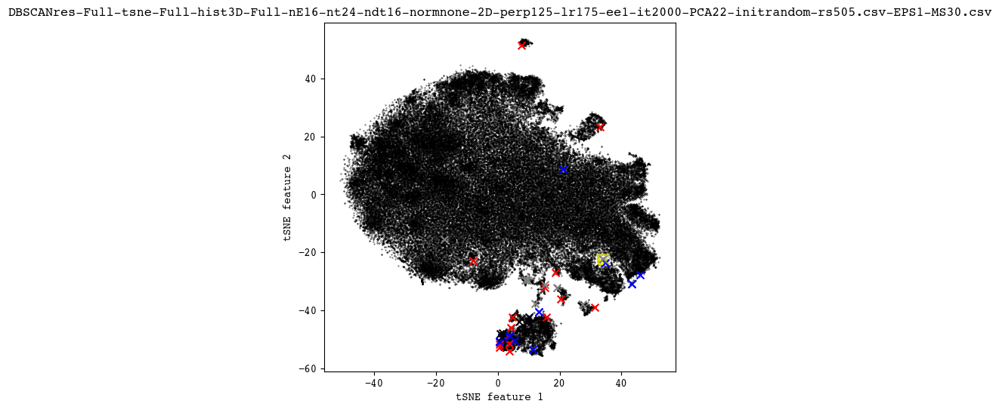

In [19]:
box_size = 2
# x0, y0 = -17.455505, -15.575752
x0, y0 = 34.027100,	-22.292643
xmin, xmax = x0 - box_size, x0 + box_size
ymin, ymax = y0 - box_size, y0 + box_size
points_in_box = df_tsne[(df_tsne['tsne1'] >= xmin) & (df_tsne['tsne1'] <= xmax) & (df_tsne['tsne2'] >= ymin) & (df_tsne['tsne2'] <= ymax)]
potential_anomalies2 = points_in_box['obsreg_id']
df_properties_anomalies2 = df_properties_global[df_properties_global['obsreg_id'].isin(potential_anomalies2)]

fig, axs = plt.subplots(1, 1, figsize=(6, 6))
plt.rcParams.update({'font.size': 10})
plt.rcParams['font.monospace'] = "Courier"
plt.rcParams["font.family"] = "monospace"
rej = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'], s=0.1, c='black', label = 'Rejected Clusters')
acc = axs.scatter(points_in_box['tsne1'], points_in_box['tsne2'], s=0.1, c='yellow', label = 'Chosen Clusters')
axs.set_xlabel('tSNE feature 1')
axs.set_ylabel('tSNE feature 2')
axs.set_title(dbscan_file)

Cluster

Text(0.5, 1.0, 'DBSCANres-Full-tsne-Full-hist3D-Full-nE16-nt24-ndt16-normnone-2D-perp50-lr120-ee1-it3500-initrandom-PCA22-rs11-EPS1.65-MS28.csv')

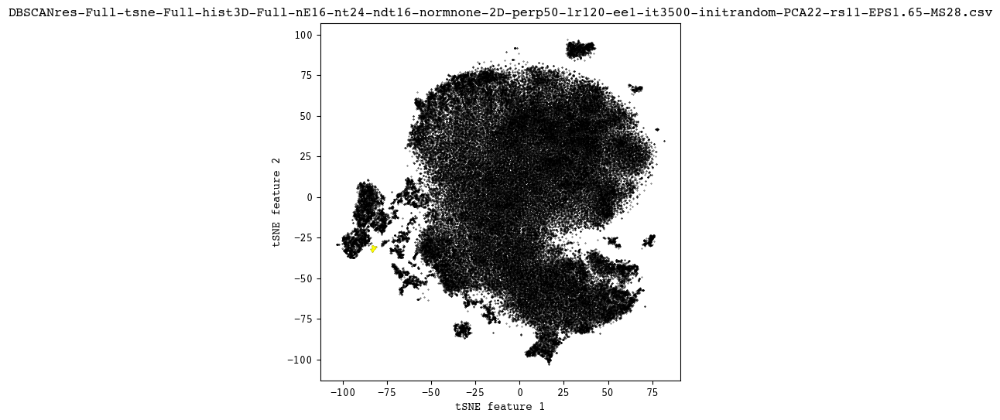

In [18]:
clust = 24
select_clusters = [clust-1]
df_select = df_tsne[df_tsne['cluster'].isin(select_clusters)]
potential_anomalies = df_select['obsreg_id']
df_properties_anomalies = df_properties_global[df_properties_global['obsreg_id'].isin(potential_anomalies)]

# df_properties_anomalies  = df_properties_anomalies[df_properties_anomalies['var_prob_b'] > 0.5]
# df_select = df_select[(df_select['tsne1'] >= 65) & (df_select['tsne1'] <= 69) & (df_select['tsne2'] >= -6) & (df_select['tsne2'] <= -5)]

# df_properties_anomalies.head(500)
# 67.453880	-5.705921	4062_31	3
# df_select = df_select[(df_select['tsne1'] >= 90) & (df_select['tsne1'] <= 95) & (df_select['tsne2'] >= 0.5) & (df_select['tsne2'] <= 1)]


fig, axs = plt.subplots(1, 1, figsize=(6, 6))
plt.rcParams.update({'font.size': 10})
plt.rcParams['font.monospace'] = "Courier"
plt.rcParams["font.family"] = "monospace"
rej = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'], s=0.1, c='black', label = 'Rejected Clusters')
acc = axs.scatter(df_select['tsne1'], df_select['tsne2'], s=0.1, c='yellow', label = 'Chosen Clusters')
axs.set_xlabel('tSNE feature 1')
axs.set_ylabel('tSNE feature 2')


axs.set_title(dbscan_file)

In [19]:

# 6. Lightcurve Plotter Function
def lightcurveplotterNEW(df_eventfiles_input,id_name,bin_size_sec,hr_window=10,bb_p0 = 0.01,band_errors = True):
    """
    DESCRIPTION: Plots lightcurves and cumulative counts for given eventfile input dataframe
    INPUT: 1. Original eventfile table, 2. Original properties table, 3. Global Path, 4. Set Name
    OUTPUT: 1. Reduced eventfile table, 2. Reduced properties table
    """
    # Define Colour Scheme
    google_blue = '#4285F4'
    google_red = '#DB4437'
    google_yellow = '#F4B400'
    google_green = '#0F9D58'
    google_purple = '#6f2da8'
    # Define Font Settings
    plt.rcParams.update({'font.size': 9})
    plt.rcParams['font.sans-serif'] = 'Helvetica'
    plt.rcParams['font.family'] = 'sans-serif'
    # Create subplots 
    fig, axs = plt.subplots(5, 1, figsize=(6, 12),constrained_layout = True)
    fig.suptitle(f'ObsRegID: {id_name}',fontweight="bold")
    # Prepare df
    df = df_eventfiles_input.copy()
    df['time'] = df_eventfiles_input['time'] - min(df_eventfiles_input['time'])
    df = df.sort_values(by='time') 
    df = df.reset_index(drop=True)
    # Create binned lightcurve
    df_binned = df.groupby(df['time'] // bin_size_sec * bin_size_sec).agg(
        broad_count = ('energy', lambda x: ((x >= 500) & (x <= 7000)).sum()),
        soft_count =('energy', lambda x: ((x >= 500) & (x < 1200)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()))
    # Plot binned lightcurve
    axs[0].plot(df_binned.index/1000, df_binned['broad_count'], color = google_blue, marker = 'o', markerfacecolor = 'black', markersize = 4)
    axs[0].set_xlabel('Time [ks]')
    axs[0].set_ylabel('Counts per Bin')
    axs[0].set_title(f'Lightcurve with {bin_size_sec}s Bin Size')
    axs[0].set_xlim([0,max(df["time"]/1000)])
    # Create rolling 3-bin averaged lightcurved
    df_rolling = df_binned.rolling(window=3, center=True).mean()
    rolling_std = df_binned.rolling(window=3, center=True).std()
    errors = rolling_std['broad_count']/math.sqrt(3)
    errors.iloc[0] = errors.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors.iloc[-1] = errors.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_h = rolling_std['hard_count']/math.sqrt(3)
    errors_h.iloc[0] = errors_h.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_h.iloc[-1] = errors_h.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_m = rolling_std['medium_count']/math.sqrt(3)
    errors_m.iloc[0] = errors_m.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_m.iloc[-1] = errors_m.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_s = rolling_std['soft_count']/math.sqrt(3)
    errors_s.iloc[0] = errors_s.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_s.iloc[-1] = errors_s.iloc[-1] * math.sqrt(3)/math.sqrt(2)
    # Plot rolling 3-bin averaged lightcurved
    axs[1].plot(df_rolling.index/1000, df_rolling['broad_count'], color = google_red)
    axs[1].errorbar(df_rolling.index/1000, df_rolling['broad_count'], yerr = errors, xerr = None,fmt ='.',color = "black",linewidth = .5,capsize = 1)
    axs[1].set_xlabel('Time [ks]')
    axs[1].set_ylabel('Counts per Bin')
    axs[1].set_title('Running Average of 3 Bins')
    axs[1].set_xlim([0,max(df["time"]/1000)])
    # Create cumulative count plot
    df_cumulative = df.copy()
    df_cumulative['count'] = 1
    df_cumulative['cumulative_count'] = df_cumulative['count'].cumsum()
    # Create a BB plot
    bb_bins = astats.bayesian_blocks(df['time'].values/1000, fitness='events',p0 = bb_p0) # p0 = 0.01 or so BASED ON VINAY ! 6?
    bin_widths = bb_bins[1:] - bb_bins[:-1]
    counts, bins =  np.histogram(df['time']/1000, bins=bb_bins)
    countrate = counts/bin_widths 
    bin_centers = (bb_bins[:-1] + bb_bins[1:]) / 2
    axs[3].step(bb_bins, np.append(countrate, countrate[-1]), where='post', color='black')
    axs[3].set_xlim([0,max(df["time"]/1000)])
    # axs[3].set_xlim(axs[1].get_xlim())
    axs[3].set_xlabel('Time [ks]')
    axs[3].set_ylabel('Count Rate')
    axs[3].set_title(f'Bayesian Blocks Count Rate (p0 = {bb_p0})')
    # Create a Energy Band Plot
    axs[2].plot(df_rolling.index/1000, df_rolling['hard_count'], color = google_blue, label='Hard')
    axs[2].plot(df_rolling.index/1000, df_rolling['medium_count'], color = google_green, label='Medium')
    axs[2].plot(df_rolling.index/1000, df_rolling['soft_count'], color = google_red, label='Soft')
    if band_errors == True:
        axs[2].errorbar(df_rolling.index/1000, df_rolling['hard_count'], yerr = errors_h, xerr = None,fmt ='.',color = google_blue,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['medium_count'], yerr = errors_m, xerr = None,fmt ='.',color = google_green,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['soft_count'], yerr = errors_s, xerr = None,fmt ='.',color = google_red,linewidth = 1,capsize = 2)
    axs[2].set_xlim([0,max(df_binned.index/1000)])
    # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    axs[2].set_ylabel('Counts')
    axs[2].set_xlabel('Time [ks]')
    axs[2].set_title(f'Energy Bands with {bin_size_sec}s Bin Size - Running Avg')
    axs[2].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)

    # # Create HR 
    # # Compute the counts for each energy band
    # df['soft_count'] = ((df['energy'] >= 500) & (df['energy'] < 1200)).rolling(hr_window).sum()
    # df['medium_count'] = ((df['energy'] >= 1200) & (df['energy'] < 2000)).rolling(hr_window).sum()
    # df['hard_count'] = ((df['energy'] >= 2000) & (df['energy'] <= 7000)).rolling(hr_window).sum()
    # df[['soft_count', 'medium_count','hard_count']] = df[['soft_count', 'medium_count','hard_count']].shift(-math.floor(hr_window/2))
    # # Compute the HR ratios using the counts
    # df['HR_hs'] = (df['hard_count'] - df['soft_count']) / (df['hard_count'] + df['soft_count'])
    # df['HR_hm'] = (df['hard_count'] - df['medium_count']) / (df['hard_count'] + df['medium_count'])
    # df['HR_ms'] = (df['medium_count'] - df['soft_count']) / (df['medium_count'] + df['soft_count'])

    # axs[4].plot(df["time"]/1000, df['HR_hs'], color = google_blue, label='H-S')
    # axs[4].plot(df["time"]/1000, df['HR_hm'], color = google_green, label='H-M')
    # axs[4].plot(df["time"]/1000, df['HR_ms'], color = google_red, label='M-S')
    # axs[4].set_xlim([0,max(df["time"]/1000)])
    # # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    # axs[4].set_ylabel('HR')
    # axs[4].set_xlabel('Time [ks]')
    # axs[4].set_title(f'Running HR over {hr_window} counts')
    # axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)

    #Create BB HR
    df_hr_bb = df.copy()
    # compute photon counts in each bin
    df_hr_bb = df_hr_bb.groupby(pd.cut(df_hr_bb['time']/1000, bb_bins)).agg(
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        soft_count=('energy', lambda x: ((x >= 500) & (x < 1200)).sum())
    )
    df_hr_bb["bb_hs"] = (df_hr_bb['hard_count'] - df_hr_bb['soft_count']) / (df_hr_bb['hard_count'] + df_hr_bb['soft_count'])
    df_hr_bb["bb_hm"]  = (df_hr_bb['hard_count'] - df_hr_bb['medium_count']) / (df_hr_bb['hard_count'] + df_hr_bb['medium_count'])
    df_hr_bb["bb_ms"]  = (df_hr_bb['medium_count'] - df_hr_bb['soft_count']) / (df_hr_bb['medium_count'] + df_hr_bb['soft_count'])
    bb_hs = df_hr_bb["bb_hs"].values
    bb_hm = df_hr_bb["bb_hm"].values
    bb_ms = df_hr_bb["bb_ms"].values
    axs[4].step(bb_bins, np.append(bb_hs, bb_hs[-1]), where='post',color = google_blue, label='H-S')
    axs[4].step(bb_bins, np.append(bb_hm, bb_hm[-1]), where='post',color = google_green, label='H-M')
    axs[4].step(bb_bins, np.append(bb_ms, bb_ms[-1]), where='post',color = google_red, label='M-S')
    axs[4].set_xlim([0,max(df["time"]/1000)])
    # axs[5].set_xlim(axs[1].get_xlim())
    axs[4].set_ylabel('HR')
    axs[4].set_xlabel('Time [ks]')
    axs[4].set_title(f'Bayesian Blocks HR')
    axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)
    plt.show()
    return


Lightcurves

62
12328_1382
Source:  2CXO J111436.2-610654
ID: 12328-1382
Counts:  1087
Observation Date:  2010-10-07T08:00:10


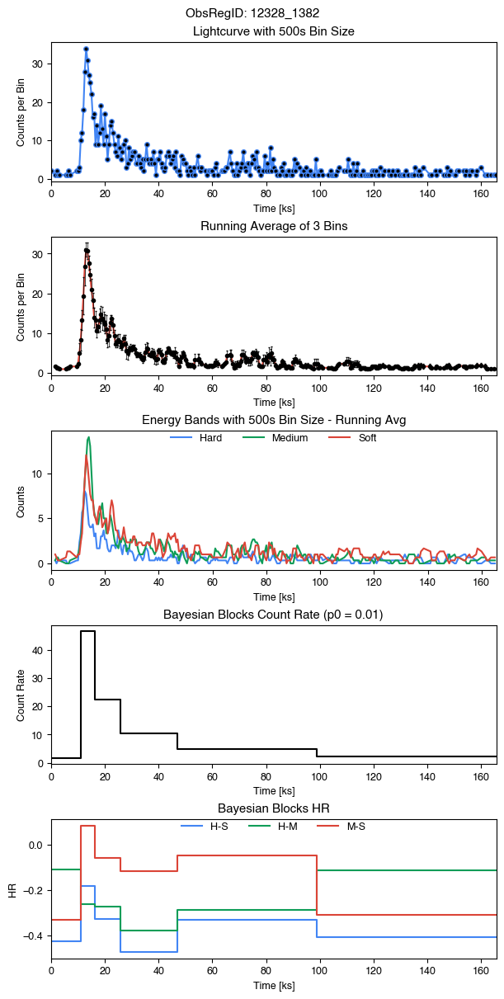

12348_365
Source:  2CXO J181837.9-170248
ID: 12348-365
Counts:  3085
Observation Date:  2011-07-30T15:17:01


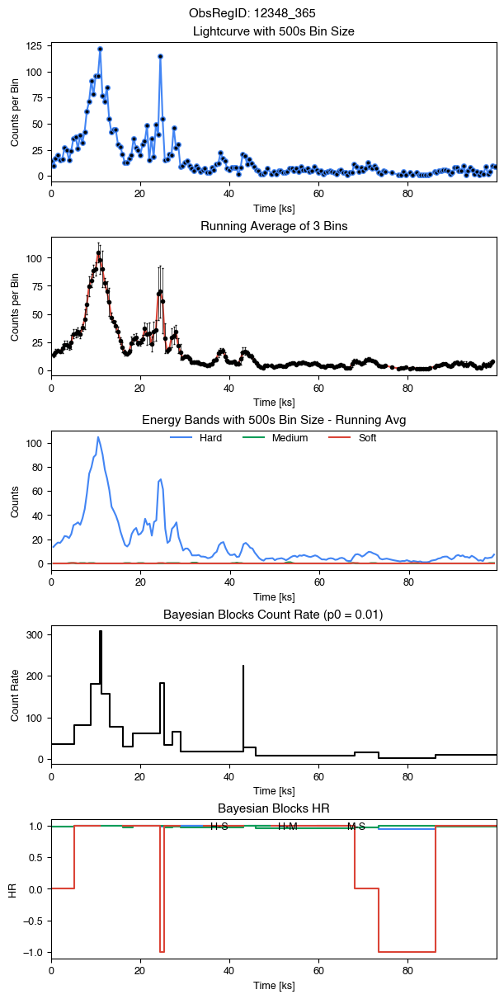

12390_1
Source:  2CXO J203150.7+400956
ID: 12390-1
Counts:  1314
Observation Date:  2011-01-25T11:25:43


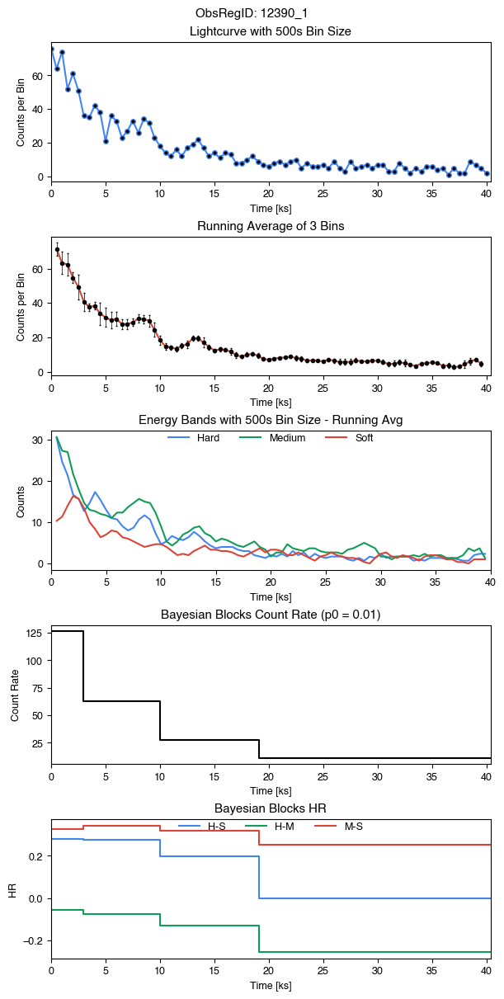

12884_10
Source:  2CXO J140828.9-270328
ID: 12884-10
Counts:  674
Observation Date:  2011-01-03T19:40:24


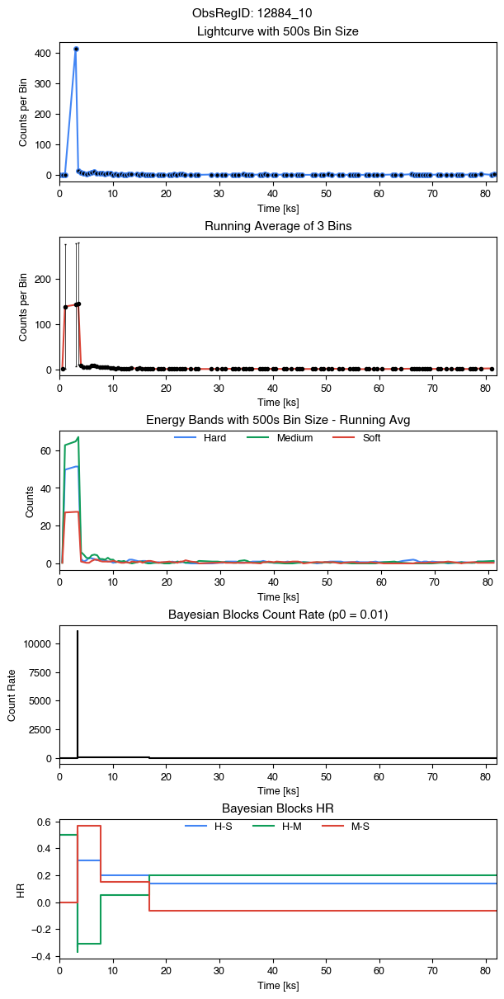

13611_841
Source:  2CXO J063947.0+094053
ID: 13611-841
Counts:  1521
Observation Date:  2011-12-07T10:59:49


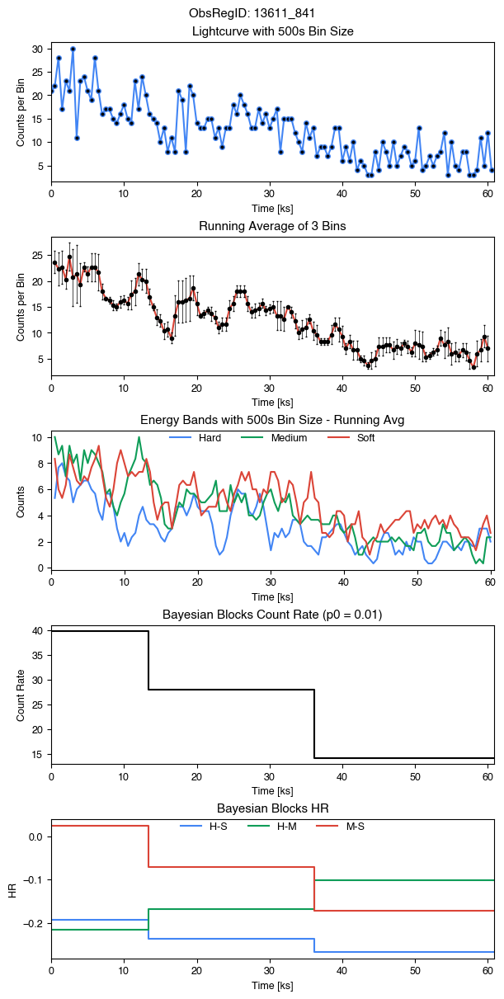

13637_2287
Source:  2CXO J053450.4-052335
ID: 13637-2287
Counts:  2049
Observation Date:  2012-10-02T07:23:02


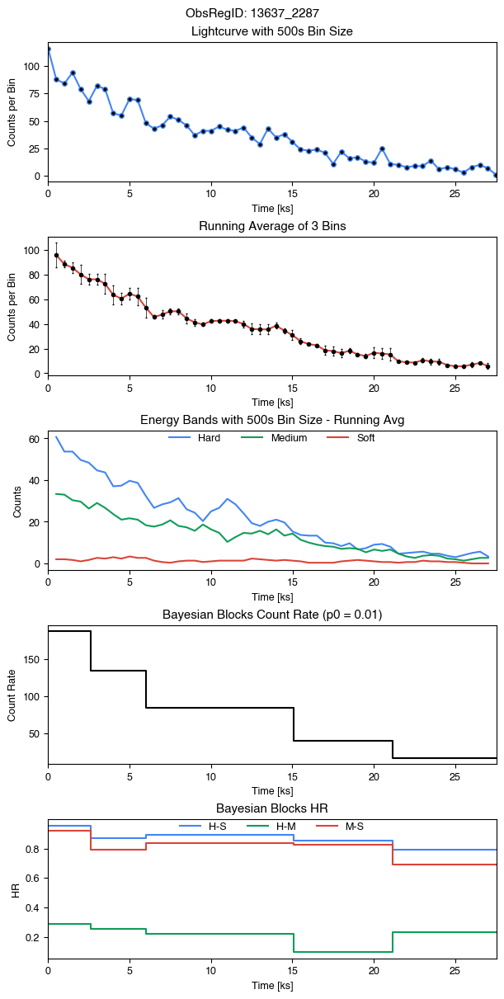

1522_635
Source:  2CXO J053502.8-052208
ID: 1522-635
Counts:  852
Observation Date:  2000-04-01T17:48:45


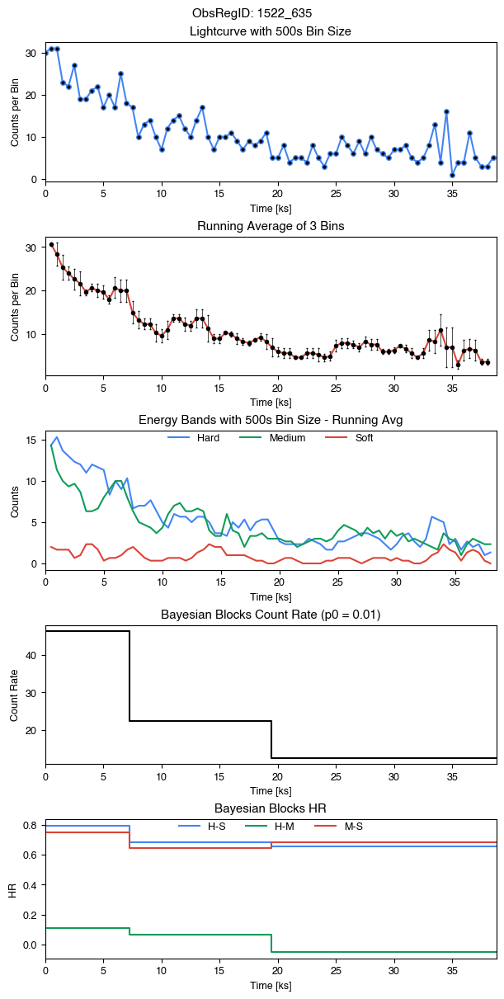

17249_27
Source:  2CXO J162622.3-242253
ID: 17249-27
Counts:  2030
Observation Date:  2014-10-06T05:48:06


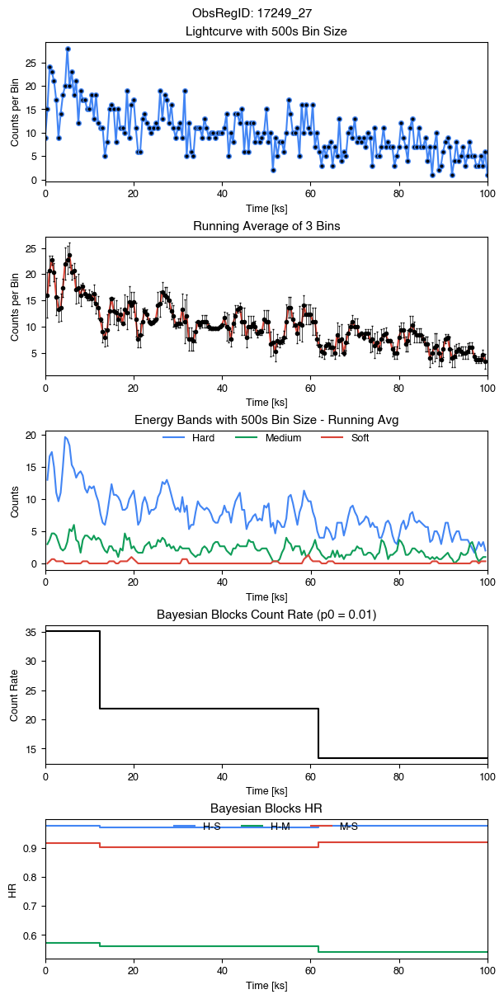

1867_103
Source:  2CXO J110941.9-763458
ID: 1867-103
Counts:  1805
Observation Date:  2001-07-02T06:42:25


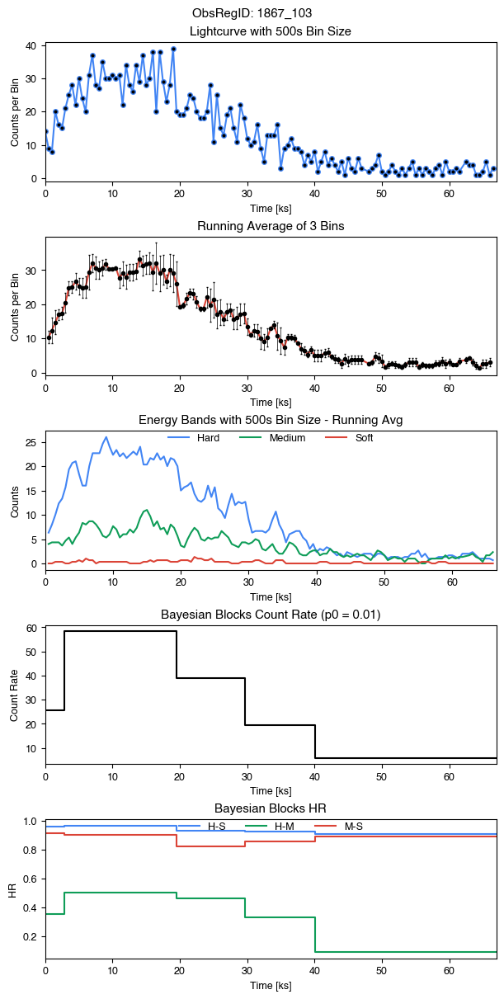

1867_116
Source:  2CXO J111229.1-765020
ID: 1867-116
Counts:  1346
Observation Date:  2001-07-02T06:42:25


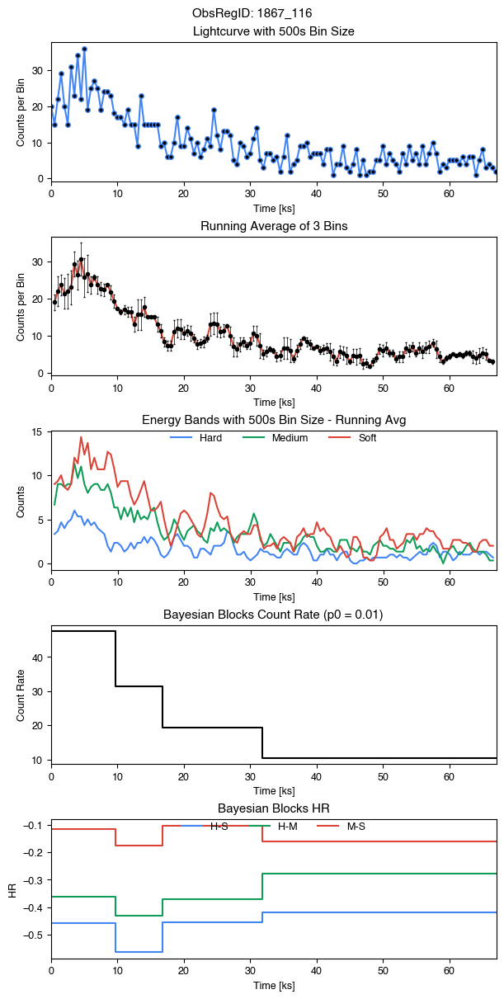

1878_148
Source:  2CXO J054131.6-015232
ID: 1878-148
Counts:  1227
Observation Date:  2001-08-08T07:02:51


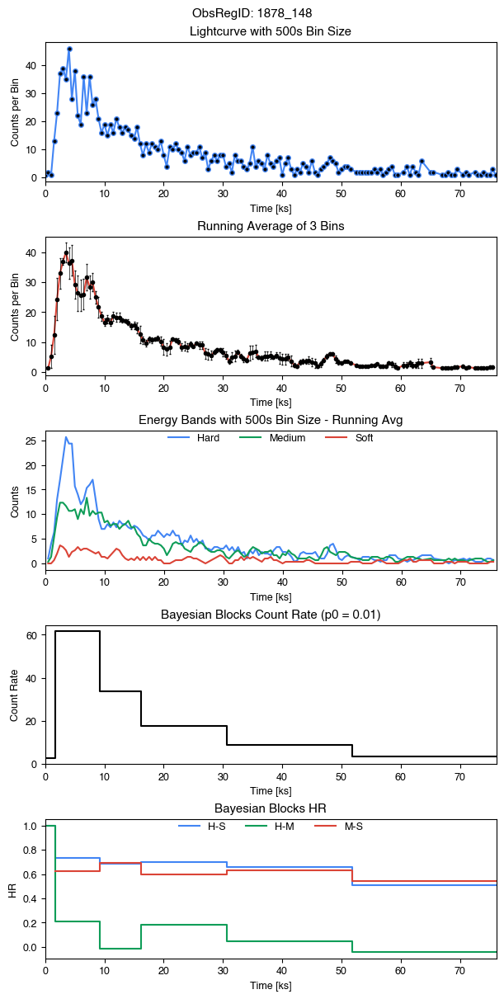

1878_164
Source:  2CXO J054145.0-015144
ID: 1878-164
Counts:  1573
Observation Date:  2001-08-08T07:02:51


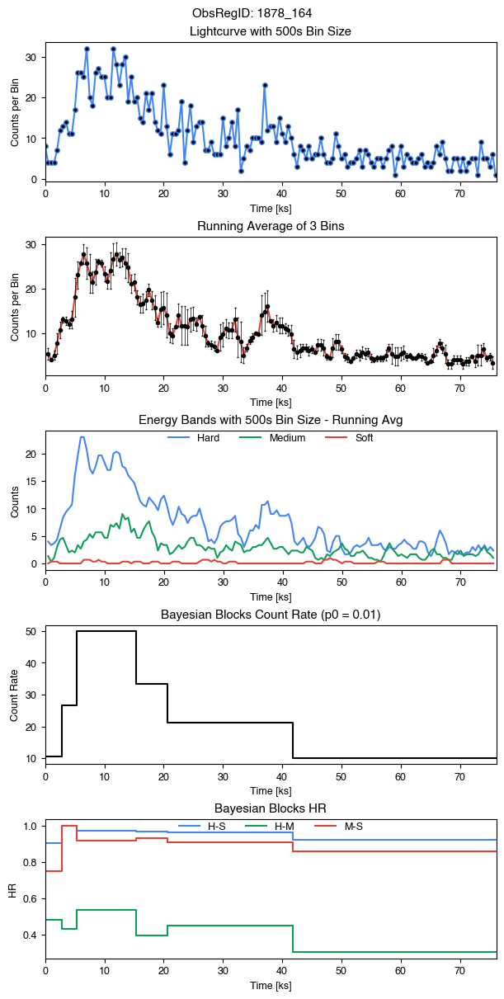

1878_270
Source:  2CXO J054148.2-015602
ID: 1878-270
Counts:  1417
Observation Date:  2001-08-08T07:02:51


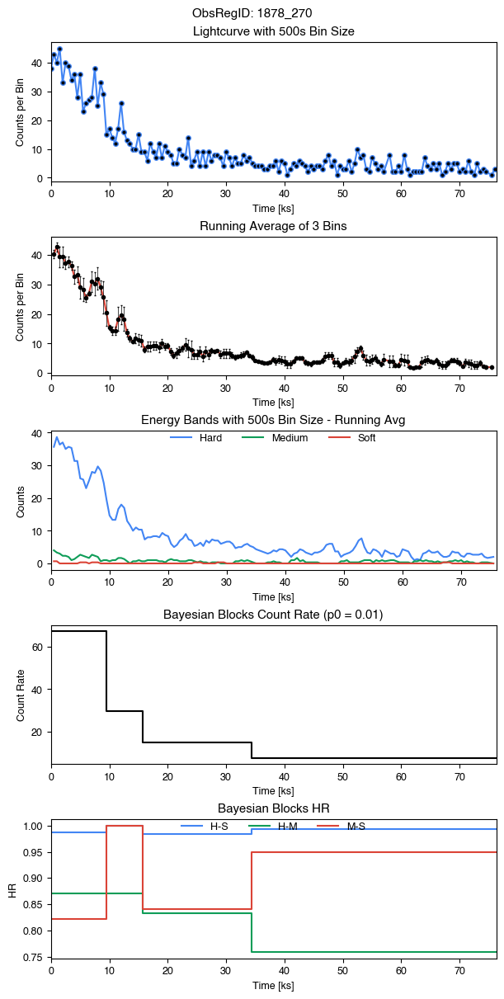

18906_43
Source:  2CXO J181722.3-170212
ID: 18906-43
Counts:  1278
Observation Date:  2017-05-29T01:08:23


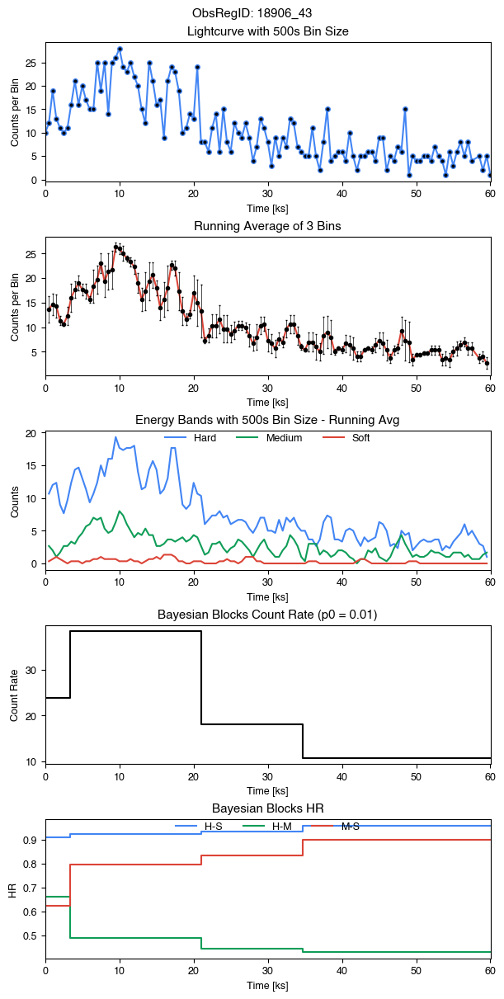

19709_22
Source:  2CXO J190133.8-365744
ID: 19709-22
Counts:  932
Observation Date:  2017-08-06T12:41:49


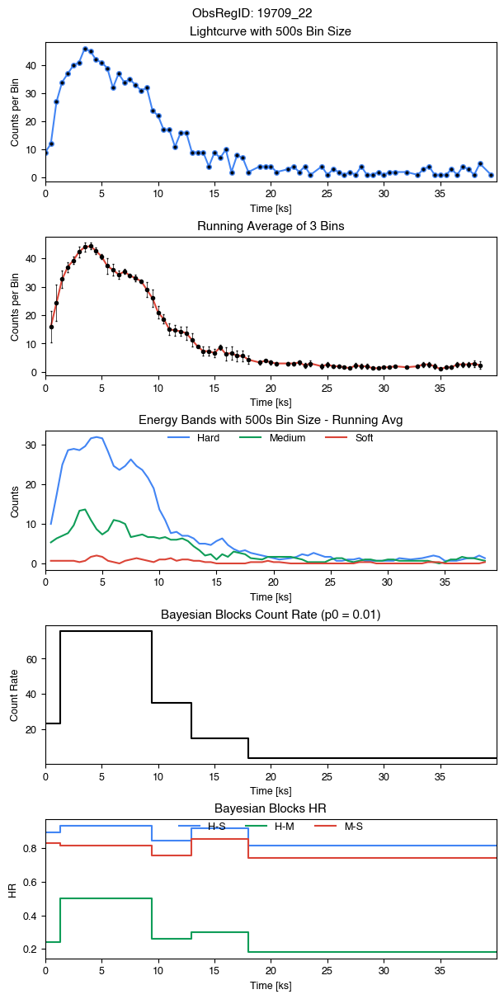

20951_41
Source:  2CXO J164051.9+464104
ID: 20951-41
Counts:  1361
Observation Date:  2018-09-28T11:09:21


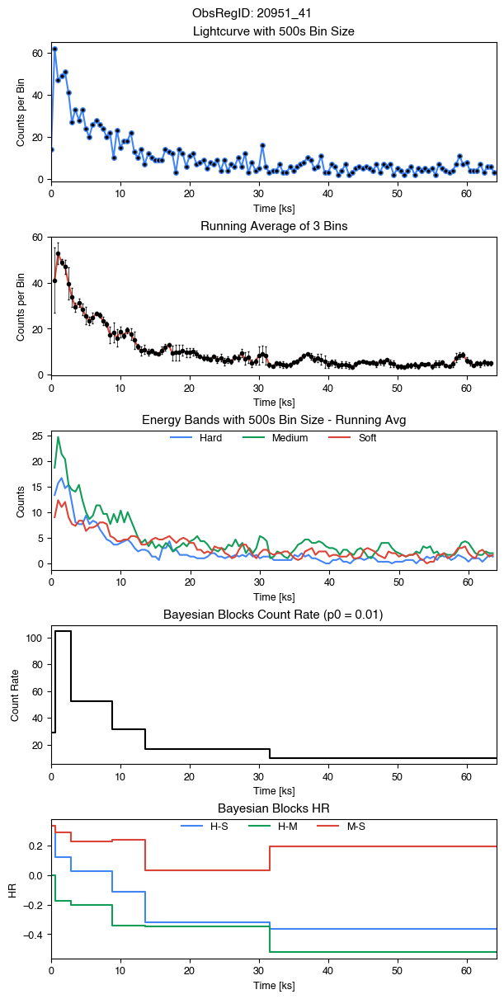

21854_488
Source:  2CXO J053617.0-051142
ID: 21854-488
Counts:  880
Observation Date:  2018-12-05T10:50:03


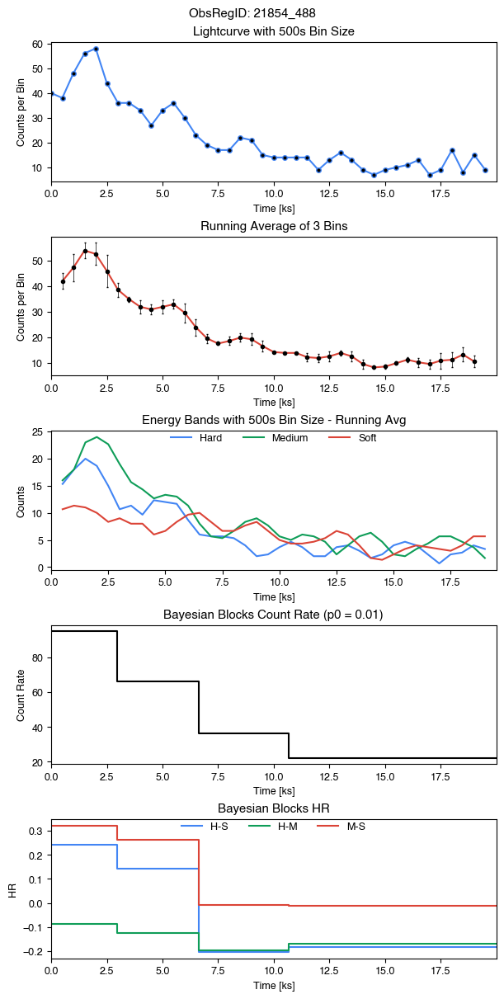

2540_209
Source:  2CXO J064106.1+093623
ID: 2540-209
Counts:  1634
Observation Date:  2002-10-28T15:03:51


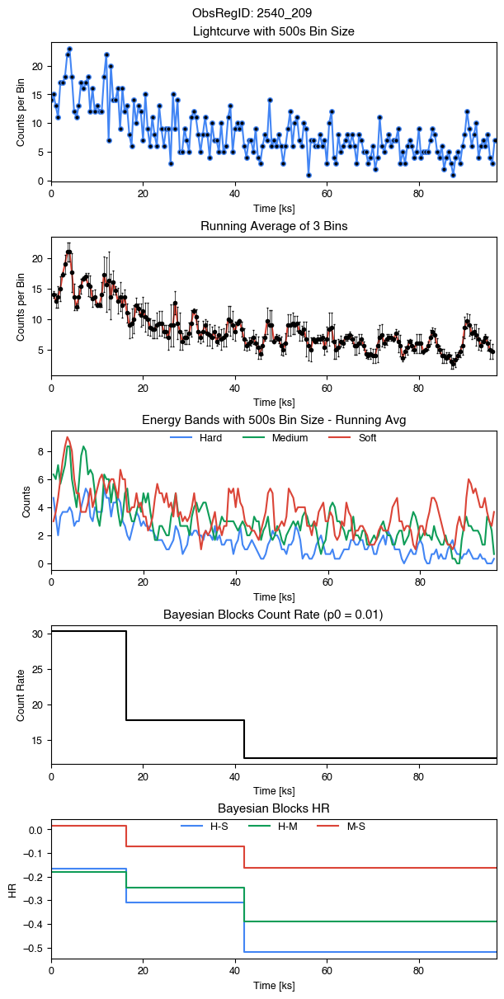

2550_146
Source:  2CXO J064056.5+095410
ID: 2550-146
Counts:  1930
Observation Date:  2002-02-09T05:26:30


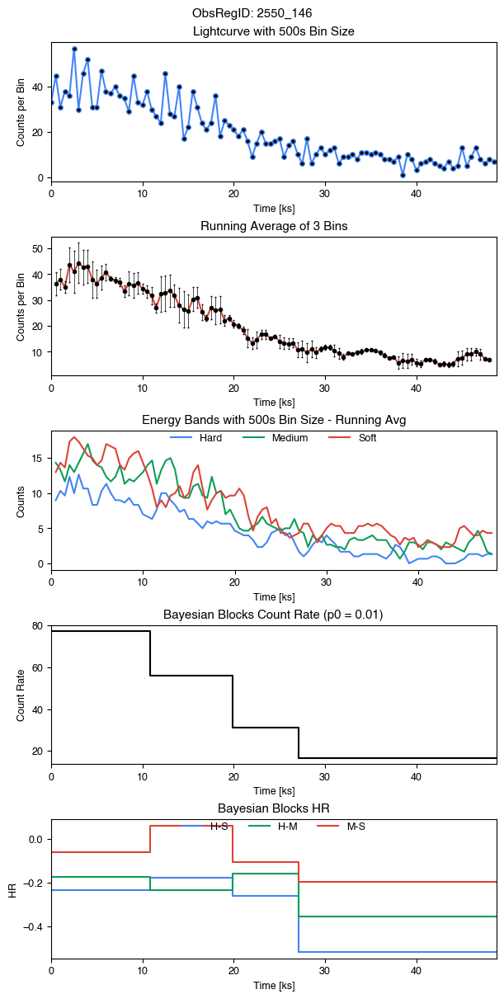

3744_2237
Source:  2CXO J053512.8-051523
ID: 3744-2237
Counts:  2224
Observation Date:  2003-01-10T16:33:58


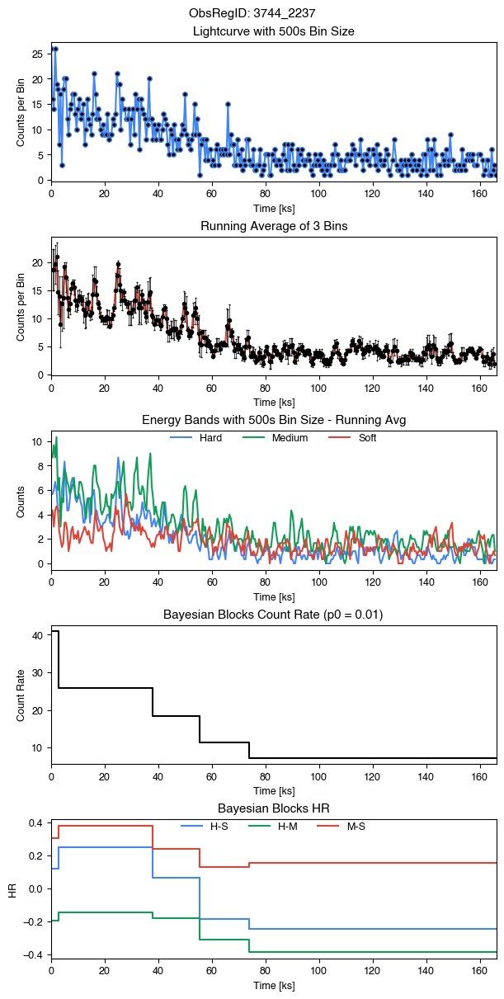

3744_2427
Source:  2CXO J053509.3-052141
ID: 3744-2427
Counts:  1089
Observation Date:  2003-01-10T16:33:58


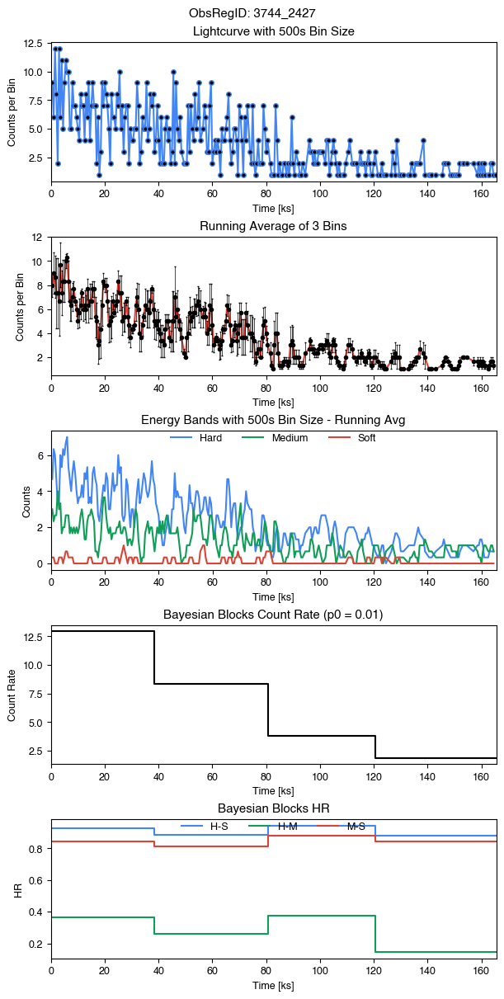

3744_2505
Source:  2CXO J053513.7-052135
ID: 3744-2505
Counts:  2465
Observation Date:  2003-01-10T16:33:58


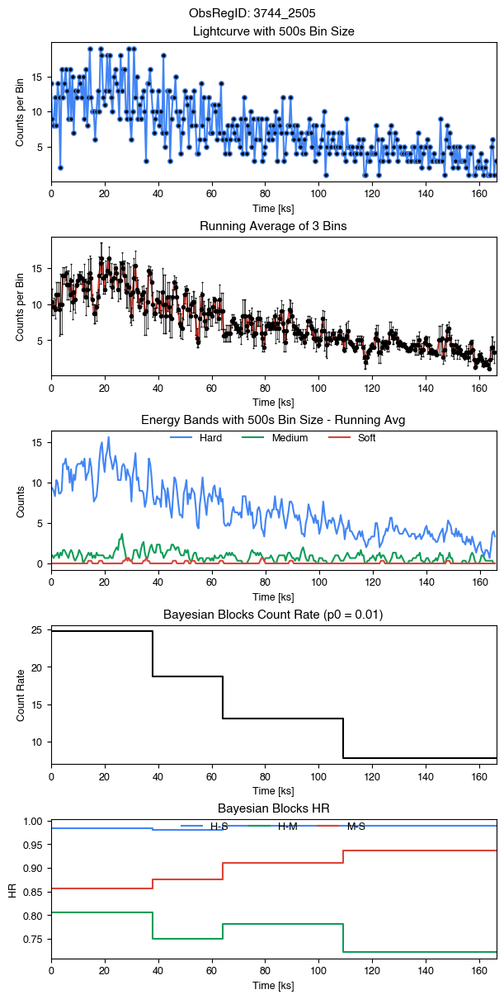

3744_2709
Source:  2CXO J053501.0-052410
ID: 3744-2709
Counts:  1224
Observation Date:  2003-01-10T16:33:58


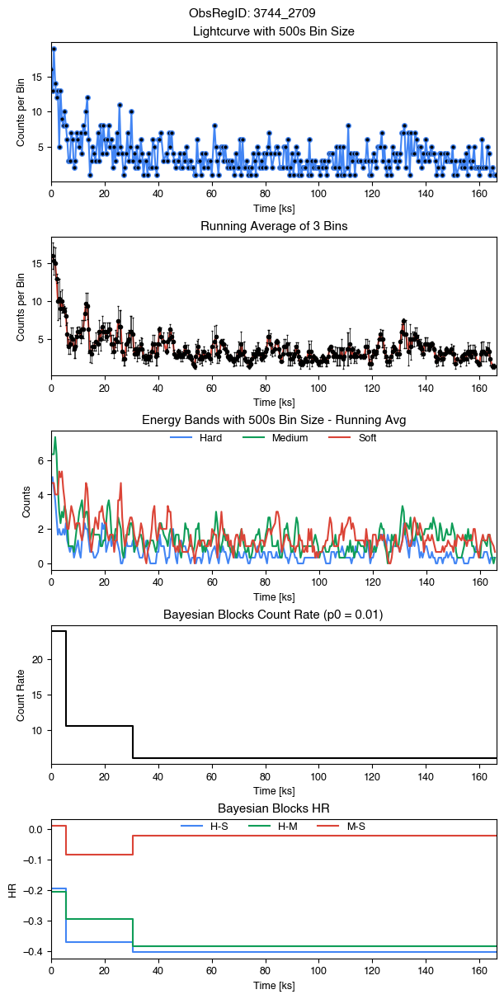

3744_741
Source:  2CXO J053515.3-052113
ID: 3744-741
Counts:  1107
Observation Date:  2003-01-10T16:33:58


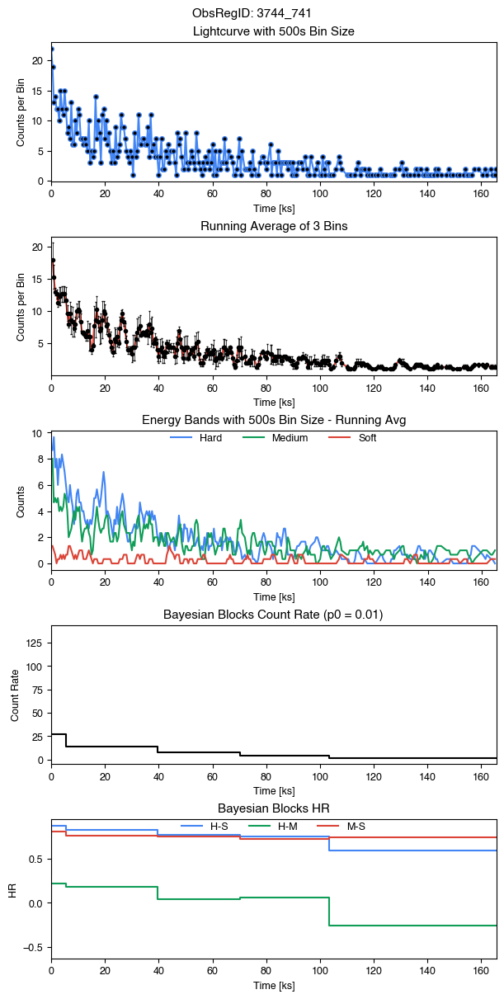

3744_885
Source:  2CXO J053508.2-051936
ID: 3744-885
Counts:  589
Observation Date:  2003-01-10T16:33:58


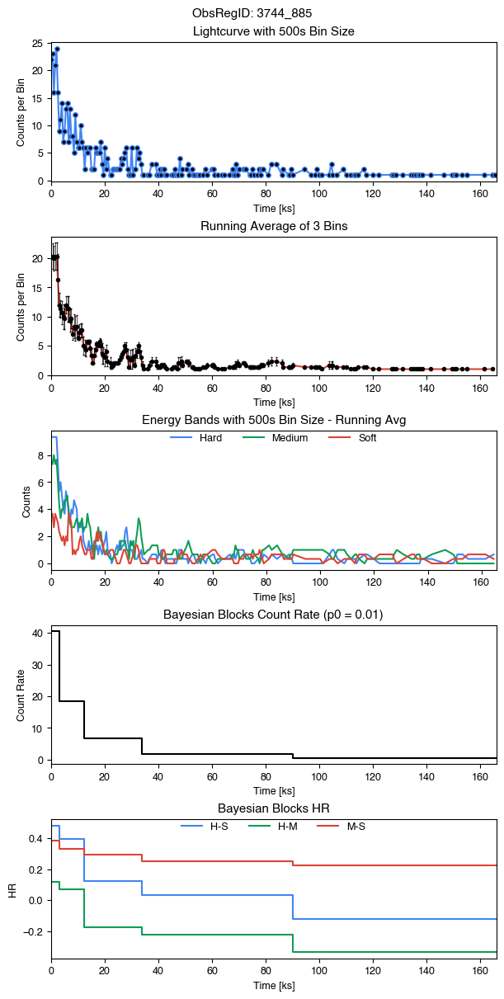

3754_465
Source:  2CXO J180413.3-241902
ID: 3754-465
Counts:  685
Observation Date:  2003-07-25T17:51:20


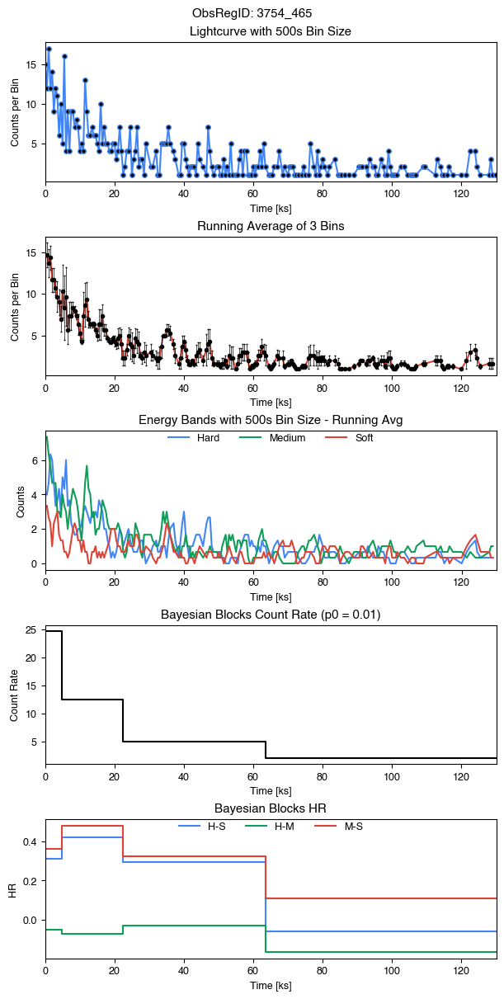

3754_95
Source:  2CXO J180416.3-242438
ID: 3754-95
Counts:  1000
Observation Date:  2003-07-25T17:51:20


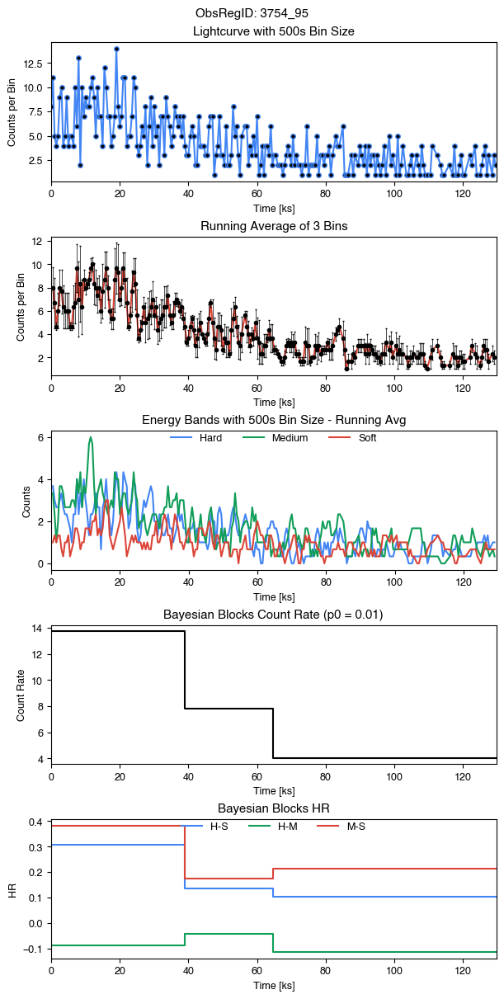

4373_2791
Source:  2CXO J053516.9-053246
ID: 4373-2791
Counts:  1265
Observation Date:  2003-01-13T07:51:03


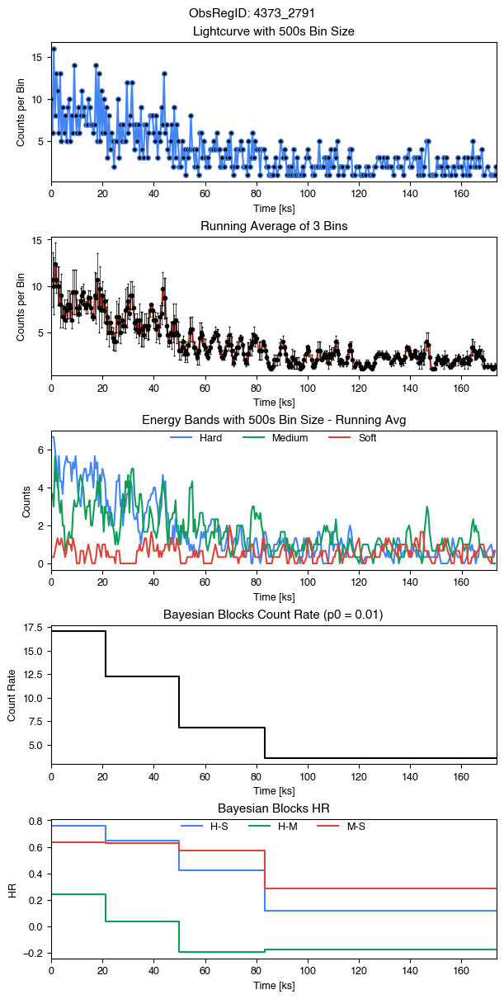

4373_3289
Source:  2CXO J053516.2-052210
ID: 4373-3289
Counts:  2433
Observation Date:  2003-01-13T07:51:03


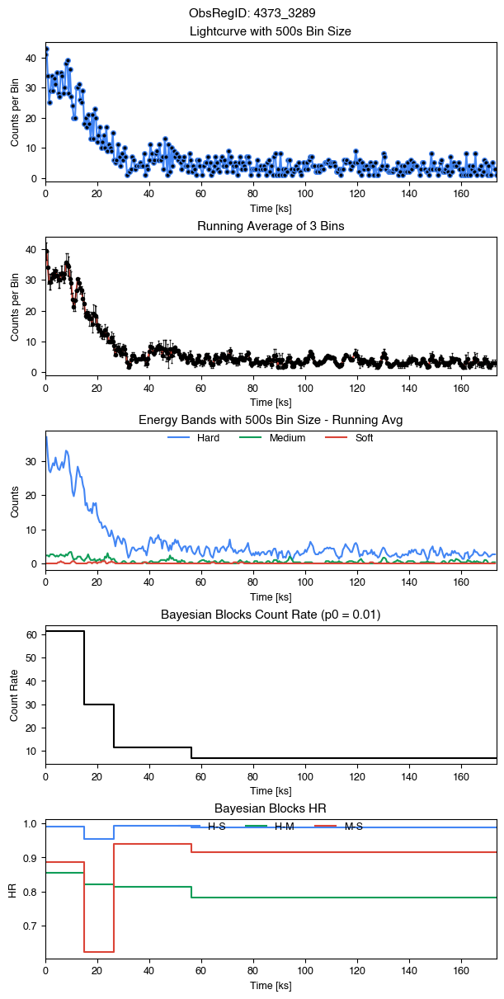

4373_735
Source:  2CXO J053458.7-052117
ID: 4373-735
Counts:  1587
Observation Date:  2003-01-13T07:51:03


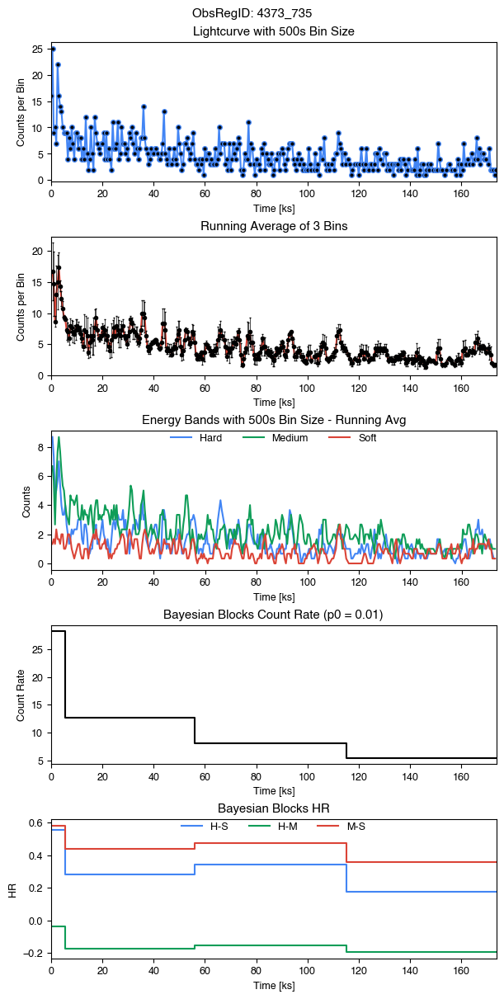

4373_801
Source:  2CXO J053516.0-052036
ID: 4373-801
Counts:  1899
Observation Date:  2003-01-13T07:51:03


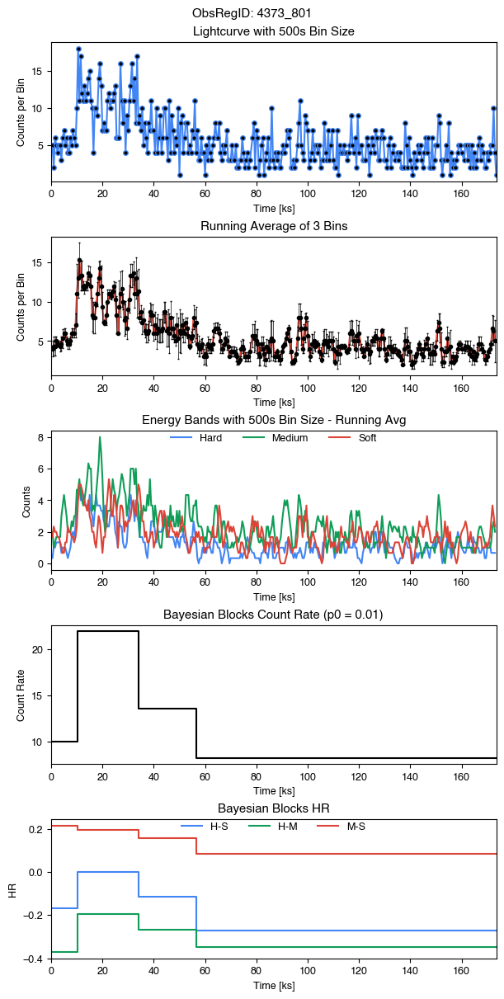

4373_812
Source:  2CXO J053519.7-052029
ID: 4373-812
Counts:  545
Observation Date:  2003-01-13T07:51:03


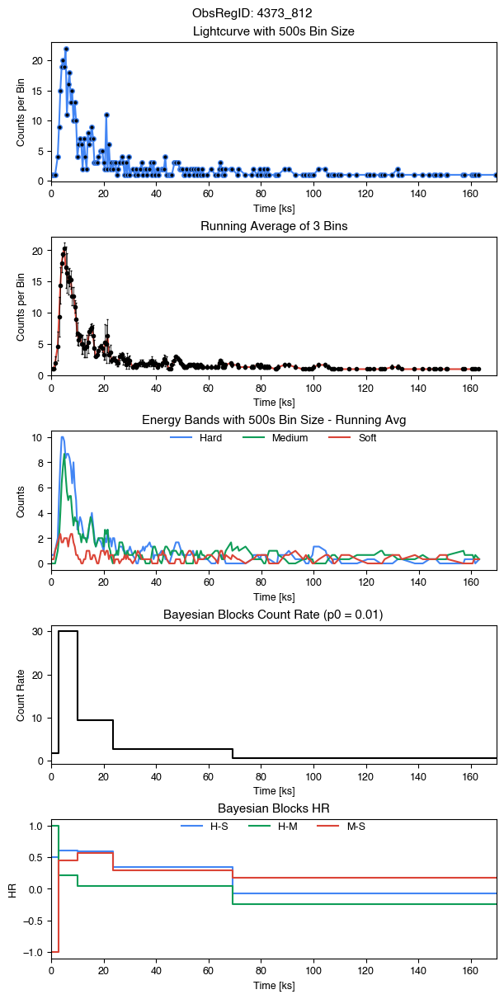

4373_824
Source:  2CXO J053501.3-052022
ID: 4373-824
Counts:  2836
Observation Date:  2003-01-13T07:51:03


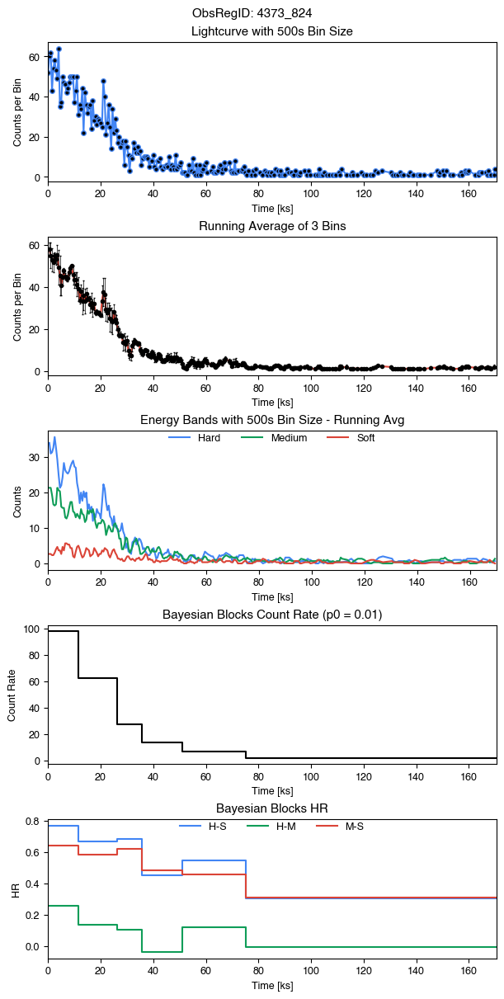

4373_875
Source:  2CXO J053521.7-051946
ID: 4373-875
Counts:  1757
Observation Date:  2003-01-13T07:51:03


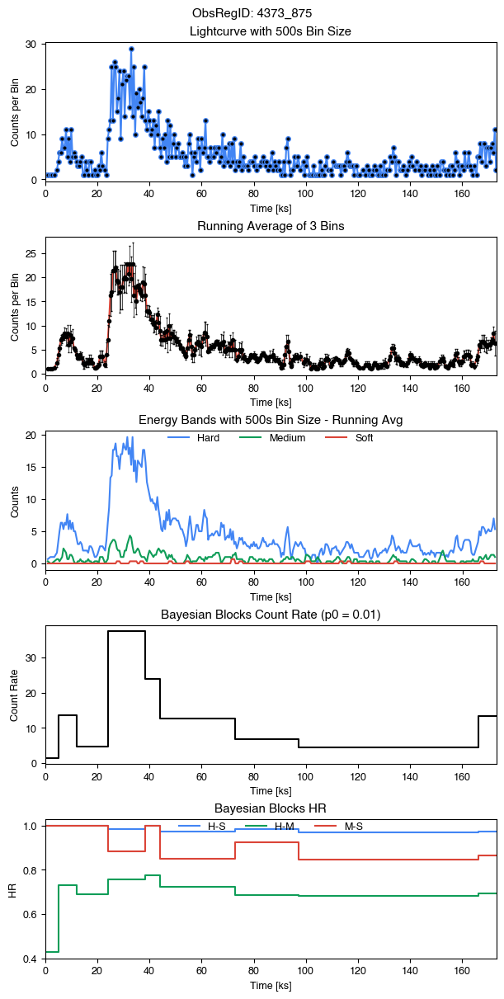

4373_962
Source:  2CXO J053530.9-051817
ID: 4373-962
Counts:  1335
Observation Date:  2003-01-13T07:51:03


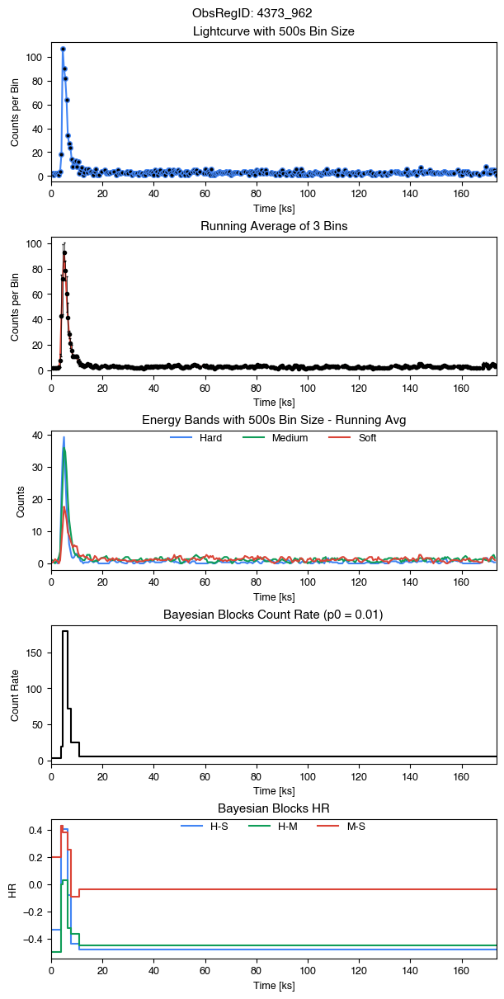

4374_1562
Source:  2CXO J053440.8-052242
ID: 4374-1562
Counts:  1581
Observation Date:  2003-01-16T00:16:53


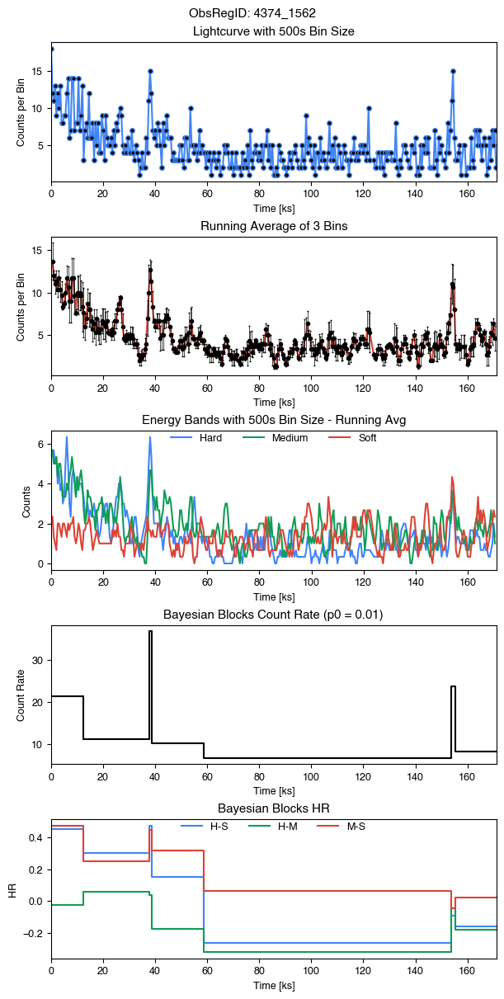

4374_2242
Source:  2CXO J053528.9-051617
ID: 4374-2242
Counts:  1447
Observation Date:  2003-01-16T00:16:53


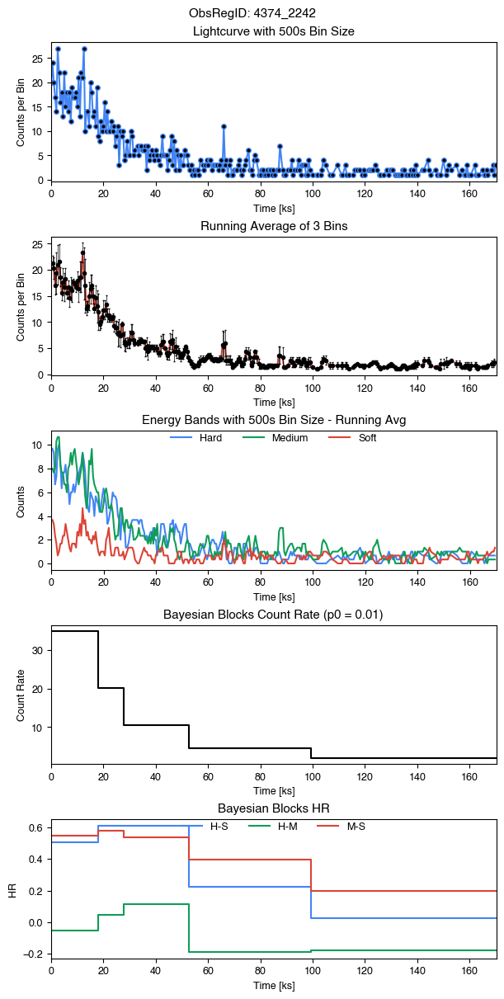

4374_2609
Source:  2CXO J053515.4-052248
ID: 4374-2609
Counts:  1462
Observation Date:  2003-01-16T00:16:53


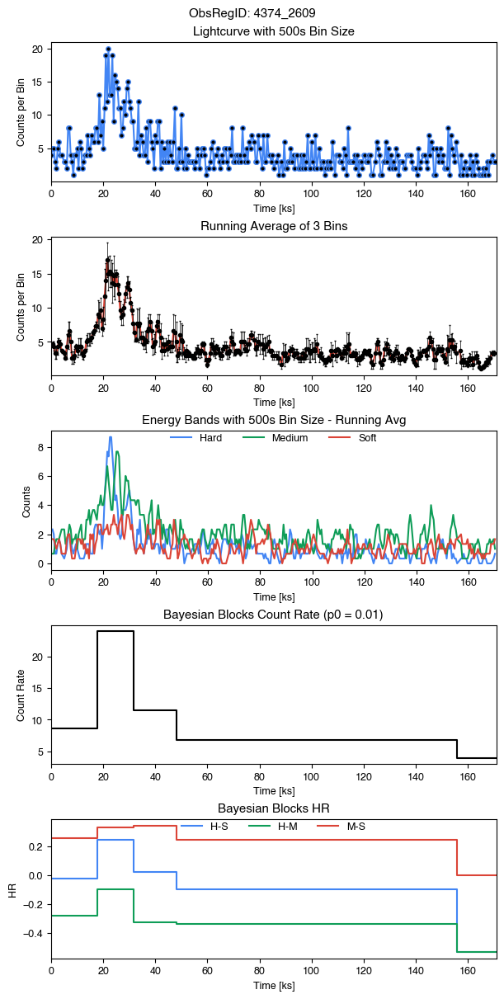

4374_375
Source:  2CXO J053501.1-052406
ID: 4374-375
Counts:  1728
Observation Date:  2003-01-16T00:16:53


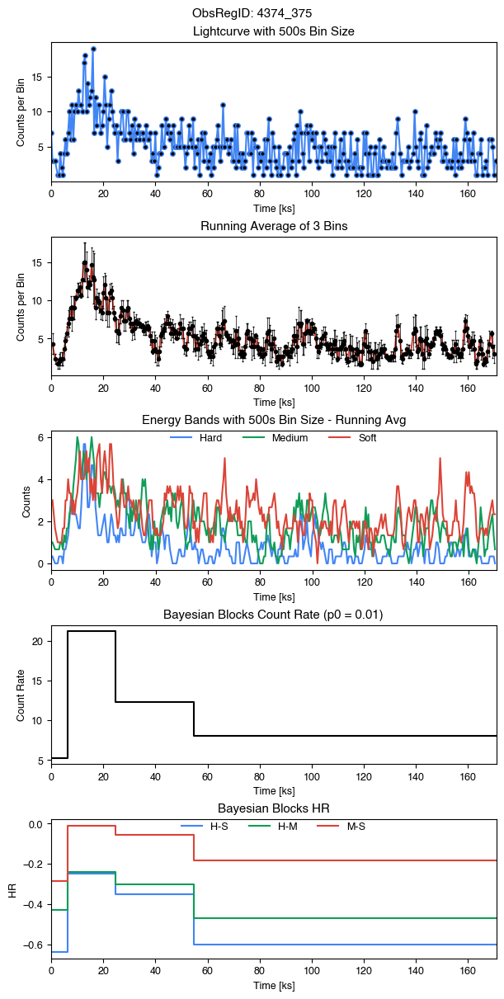

4374_674
Source:  2CXO J053521.6-052146
ID: 4374-674
Counts:  2103
Observation Date:  2003-01-16T00:16:53


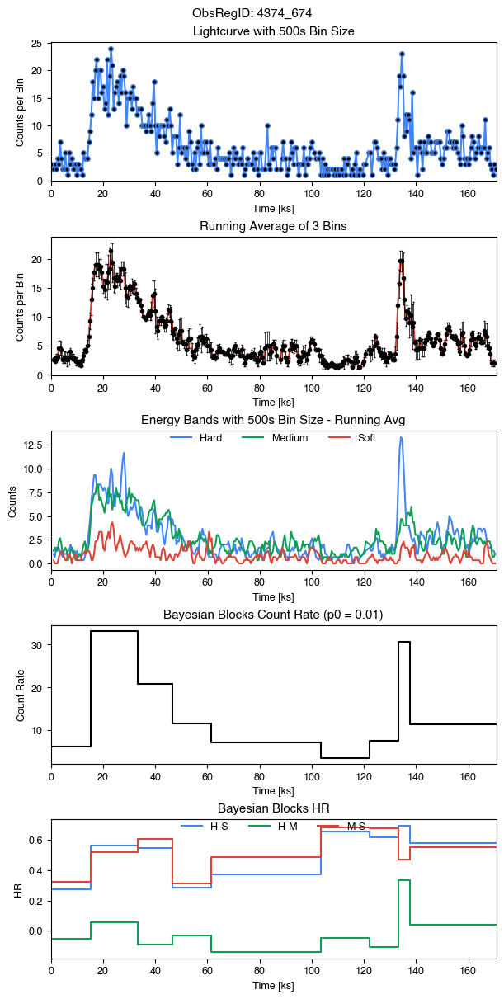

4374_829
Source:  2CXO J053516.7-052019
ID: 4374-829
Counts:  1814
Observation Date:  2003-01-16T00:16:53


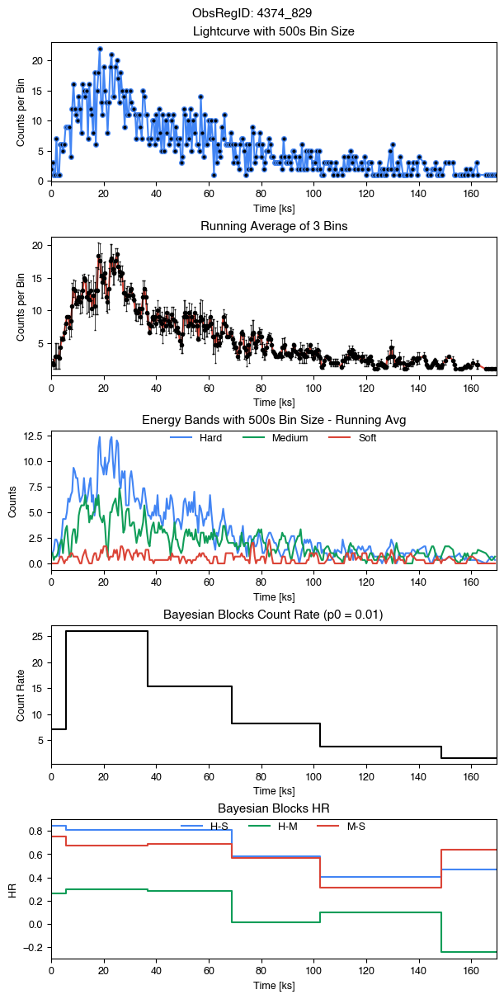

4374_854
Source:  2CXO J053529.6-052001
ID: 4374-854
Counts:  1009
Observation Date:  2003-01-16T00:16:53


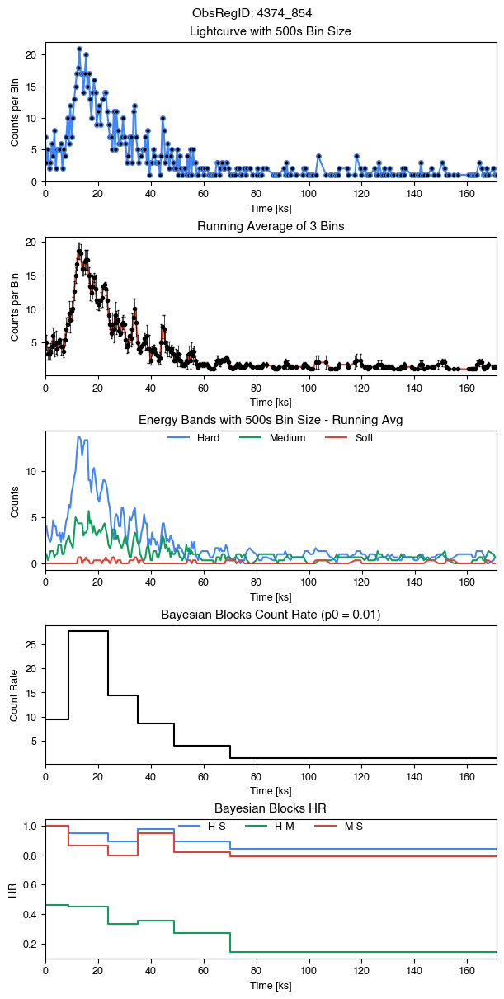

4374_898
Source:  2CXO J053517.5-051928
ID: 4374-898
Counts:  2405
Observation Date:  2003-01-16T00:16:53


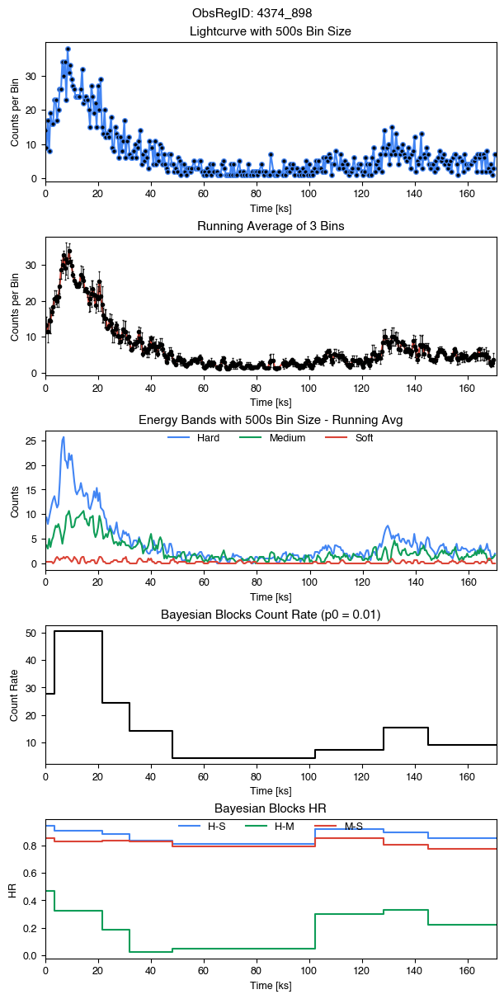

4395_1494
Source:  2CXO J053522.9-051744
ID: 4395-1494
Counts:  2513
Observation Date:  2003-01-08T21:15:16


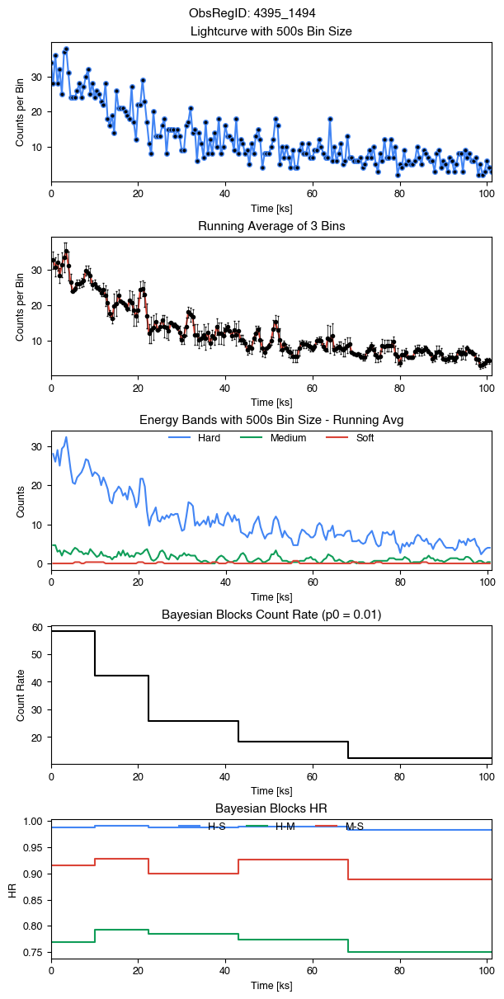

4396_2550
Source:  2CXO J053507.2-052226
ID: 4396-2550
Counts:  2026
Observation Date:  2003-01-18T14:51:01


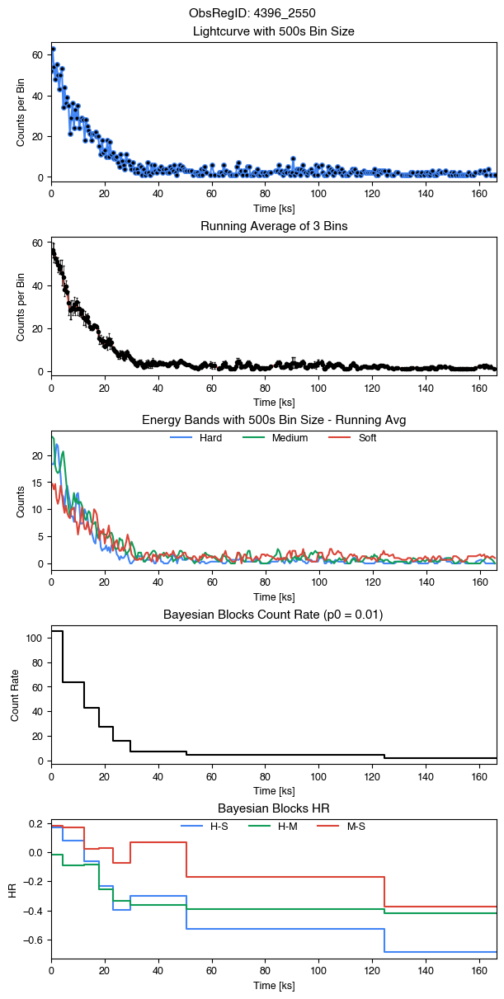

4396_542
Source:  2CXO J053457.7-052251
ID: 4396-542
Counts:  966
Observation Date:  2003-01-18T14:51:01


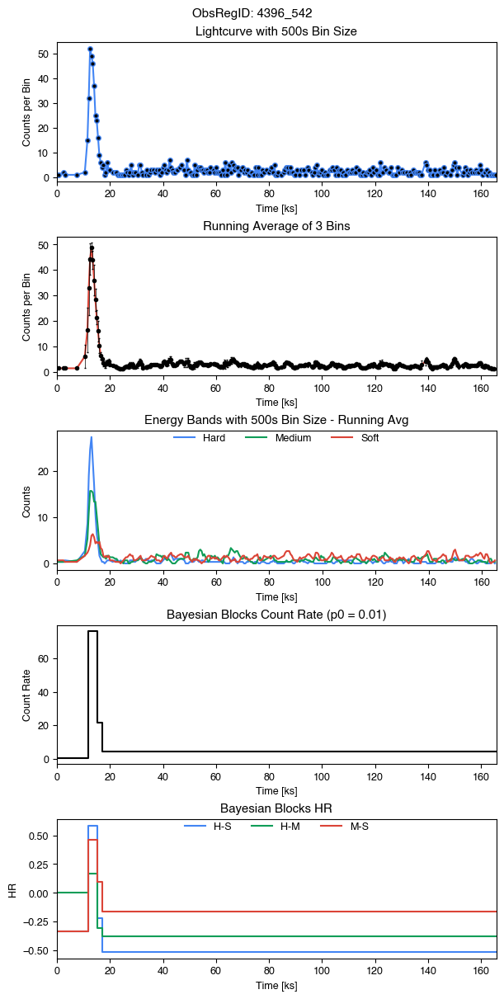

4396_848
Source:  2CXO J053519.2-052007
ID: 4396-848
Counts:  1738
Observation Date:  2003-01-18T14:51:01


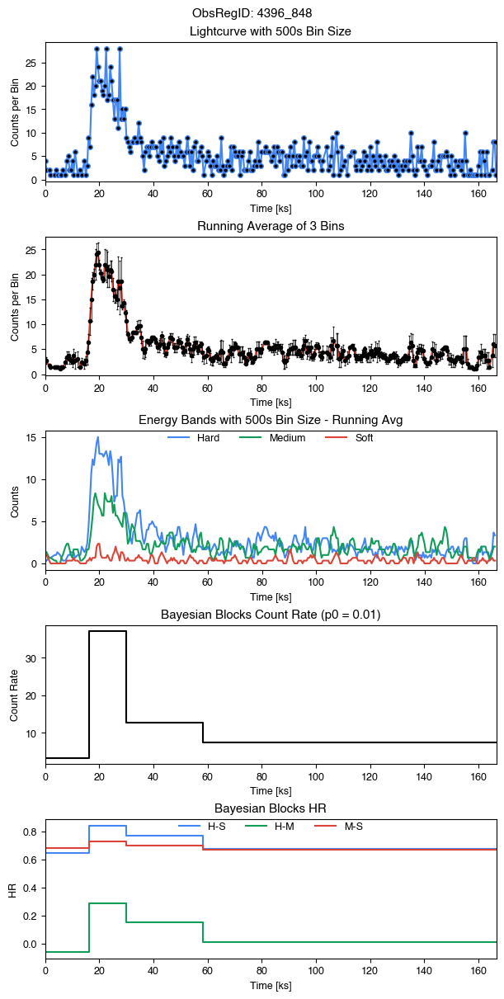

4396_929
Source:  2CXO J053531.2-051855
ID: 4396-929
Counts:  1451
Observation Date:  2003-01-18T14:51:01


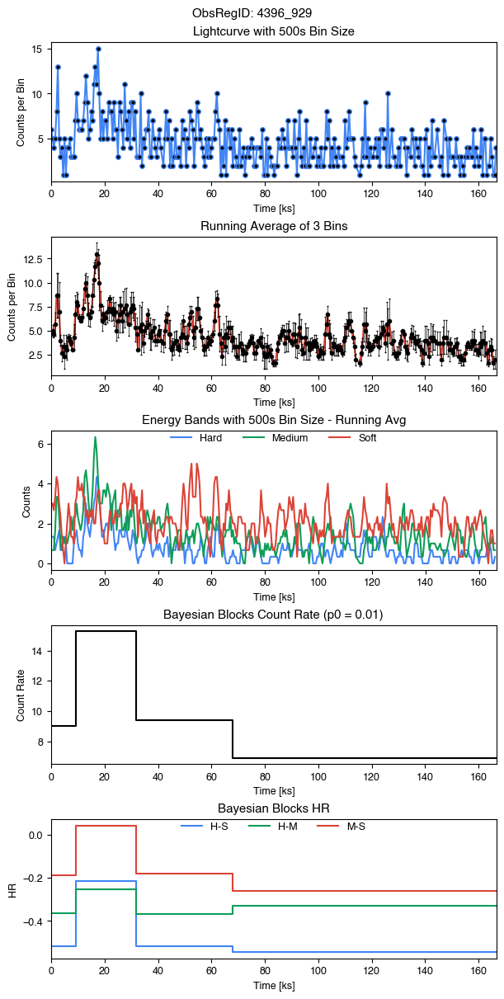

4444_438
Source:  2CXO J180412.4-241943
ID: 4444-438
Counts:  995
Observation Date:  2003-07-28T00:21:10


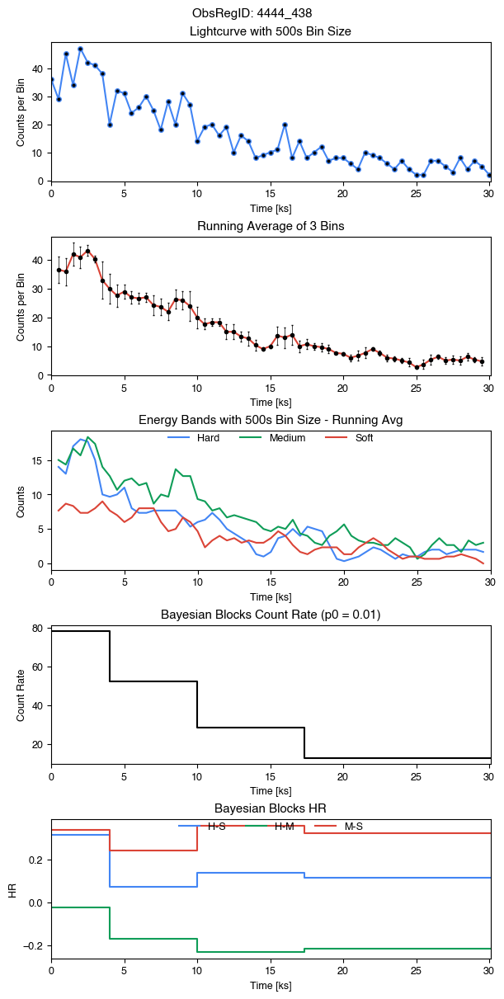

4469_175
Source:  2CXO J071845.2-245643
ID: 4469-175
Counts:  1373
Observation Date:  2003-12-23T03:19:19


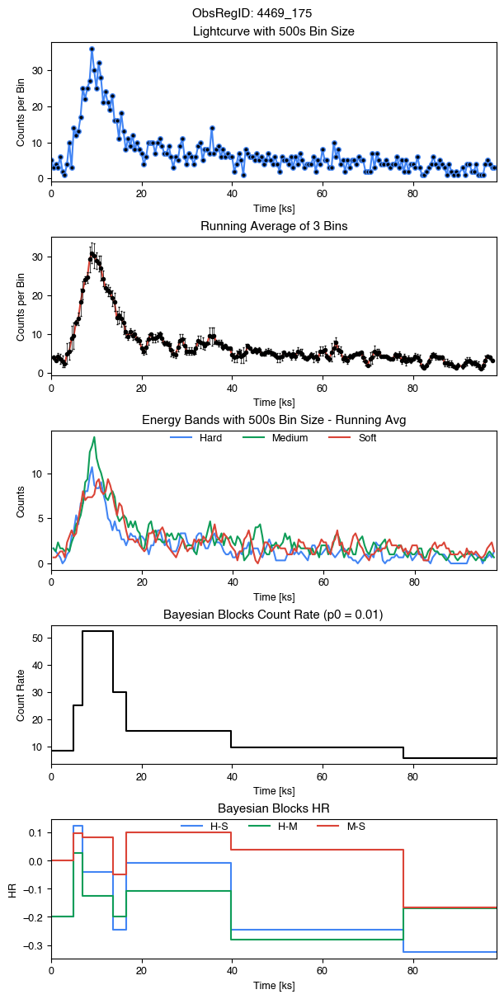

4495_961
Source:  2CXO J104430.9-592843
ID: 4495-961
Counts:  906
Observation Date:  2004-09-21T17:53:33


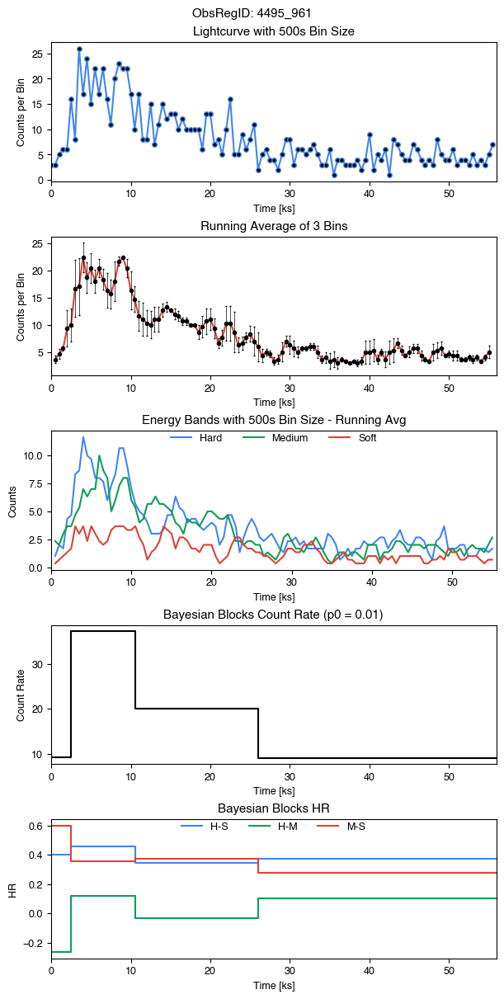

5372_216
Source:  2CXO J165400.8-415238
ID: 5372-216
Counts:  728
Observation Date:  2005-07-03T06:33:29


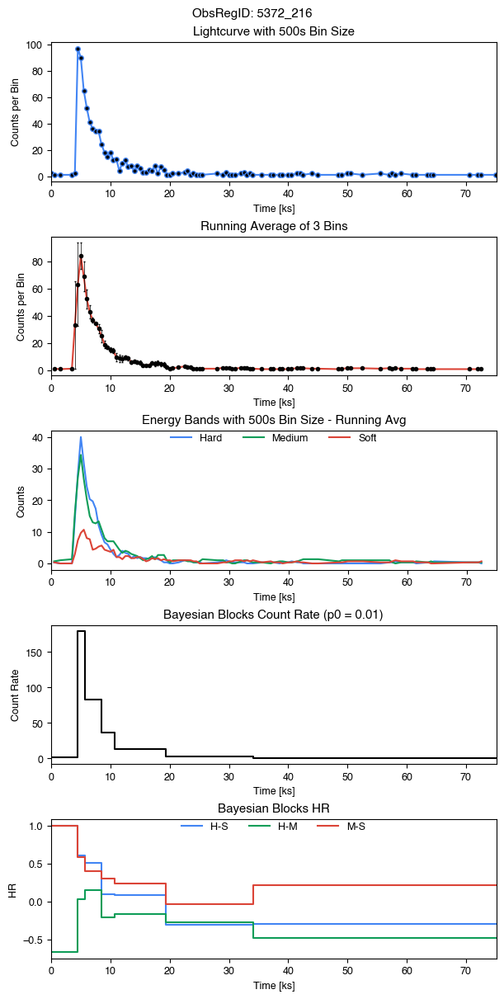

635_96
Source:  2CXO J162622.3-242253
ID: 635-96
Counts:  6649
Observation Date:  2000-04-13T18:52:44


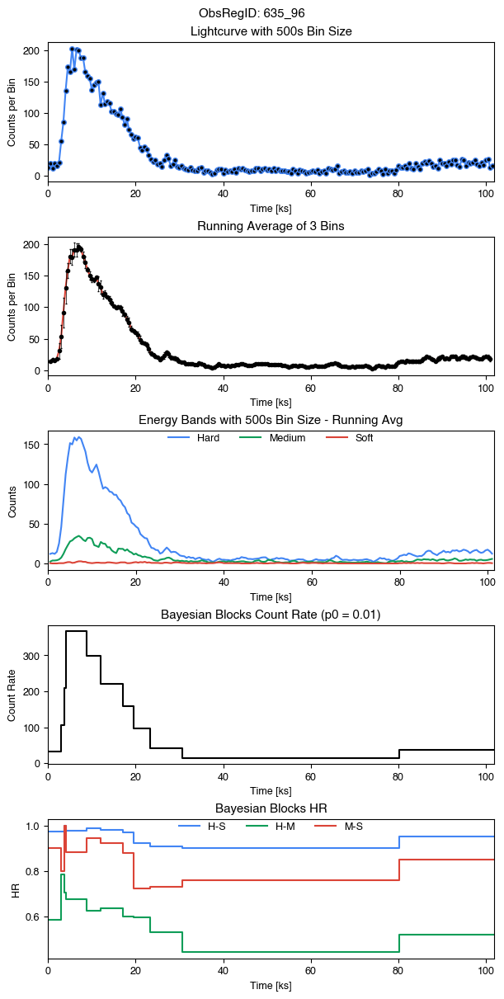

637_23
Source:  2CXO J162616.8-242223
ID: 637-23
Counts:  2044
Observation Date:  2000-05-16T00:00:29


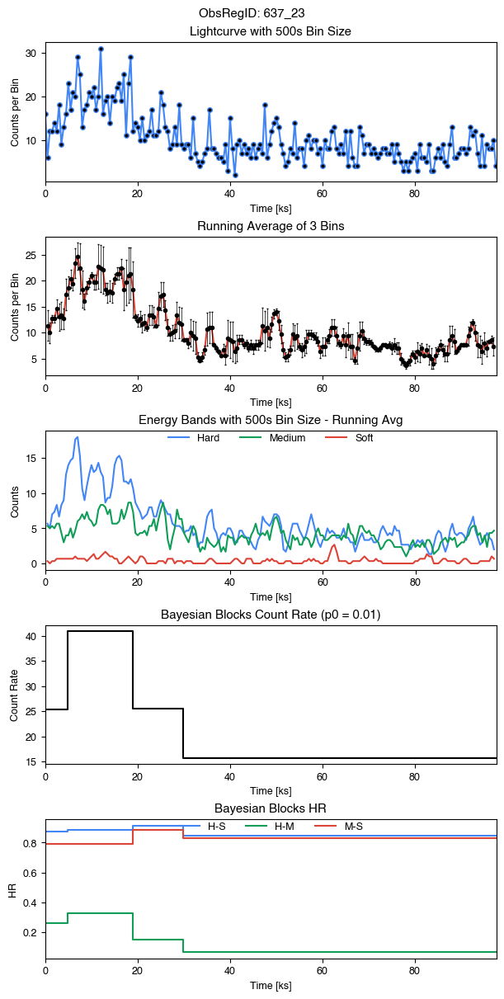

6396_14
Source:  2CXO J105510.3-773106
ID: 6396-14
Counts:  731
Observation Date:  2006-05-15T04:56:20


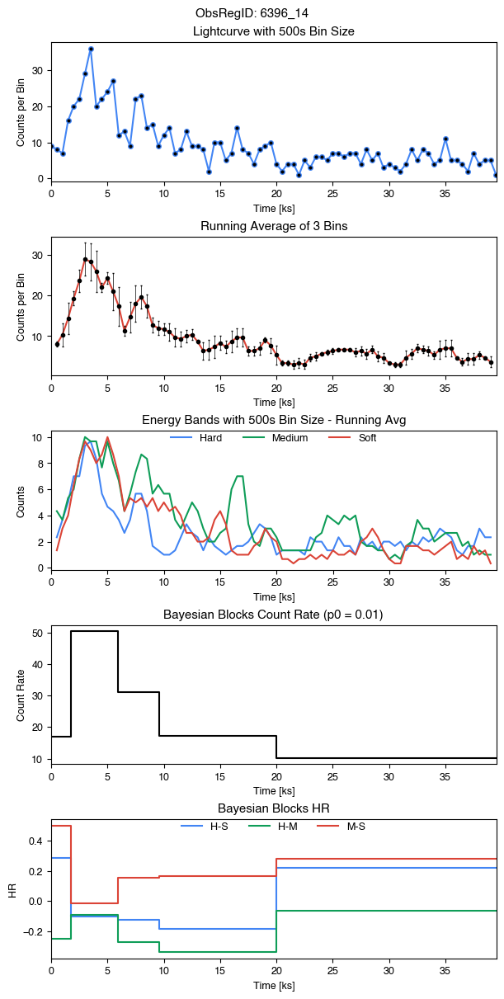

6420_825
Source:  2CXO J182039.0-160836
ID: 6420-825
Counts:  1678
Observation Date:  2006-08-01T02:33:18


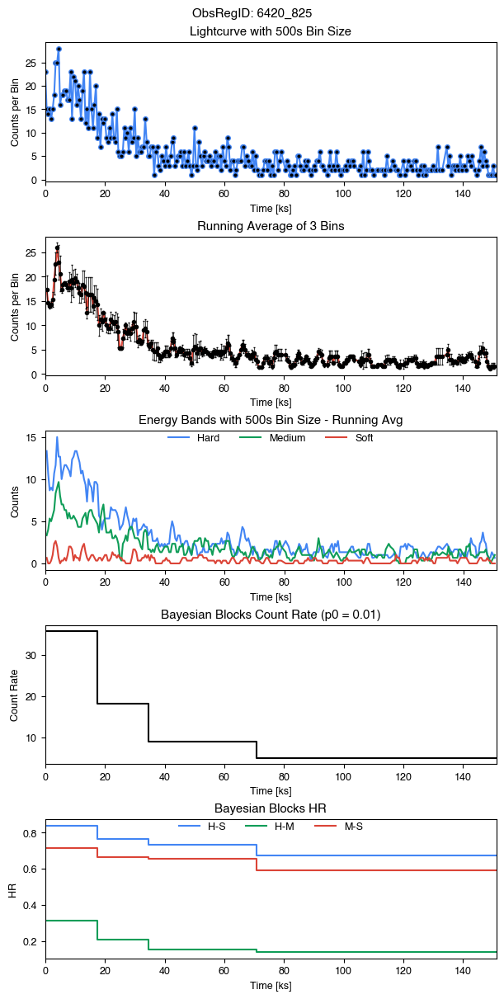

7420_279
Source:  2CXO J183127.6-020509
ID: 7420-279
Counts:  1216
Observation Date:  2007-08-13T00:06:22


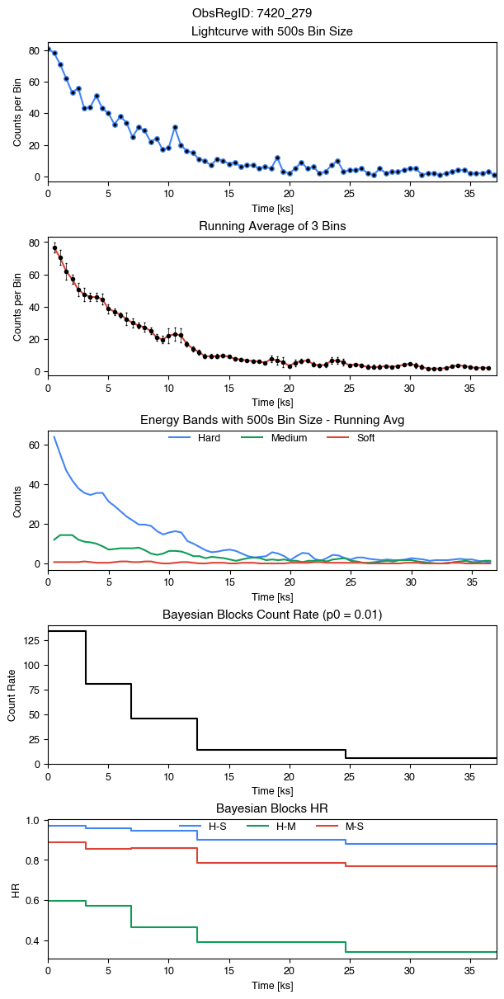

8905_146
Source:  2CXO J111105.5-610146
ID: 8905-146
Counts:  1626
Observation Date:  2007-11-10T13:53:44


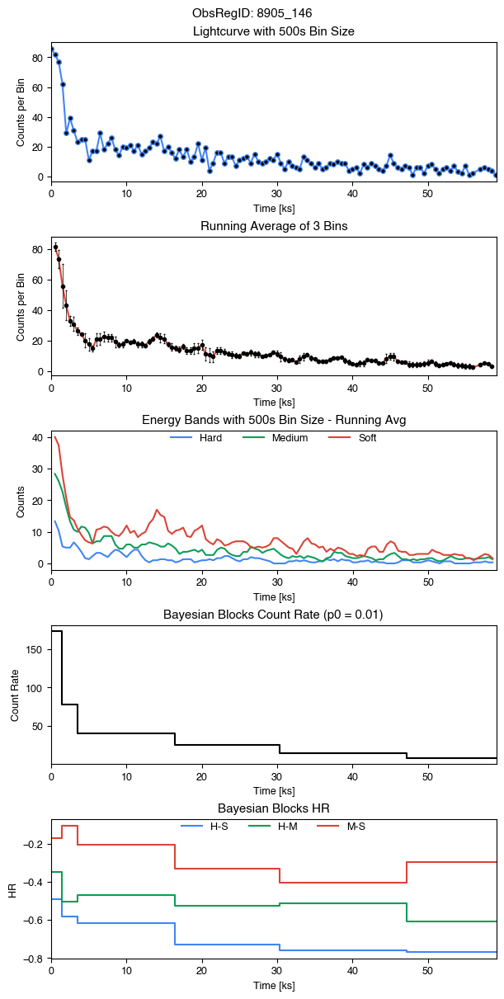

9132_636
Source:  2CXO J182422.0-245455
ID: 9132-636
Counts:  653
Observation Date:  2008-08-07T21:04:33


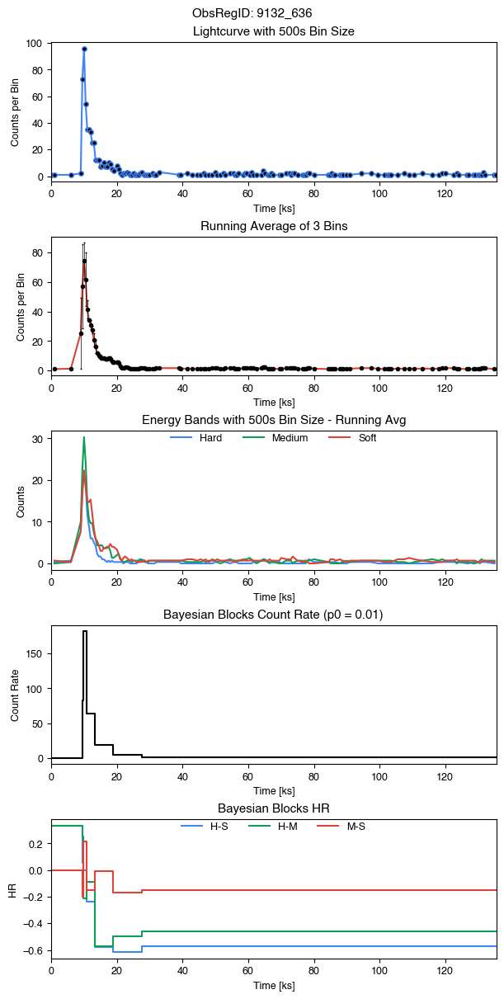

9484_432
Source:  2CXO J104335.7-591635
ID: 9484-432
Counts:  592
Observation Date:  2008-08-19T06:54:32


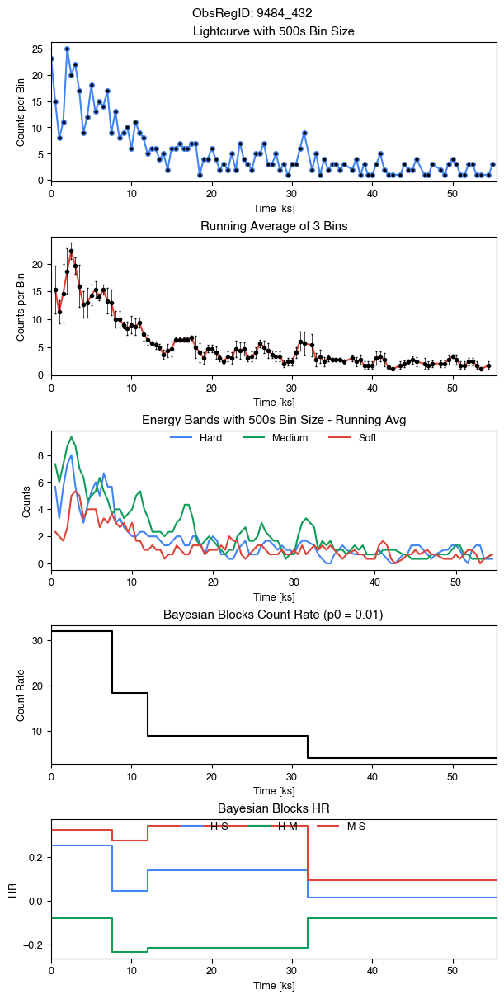

9485_184
Source:  2CXO J104752.5-600215
ID: 9485-184
Counts:  1213
Observation Date:  2008-09-08T12:37:27


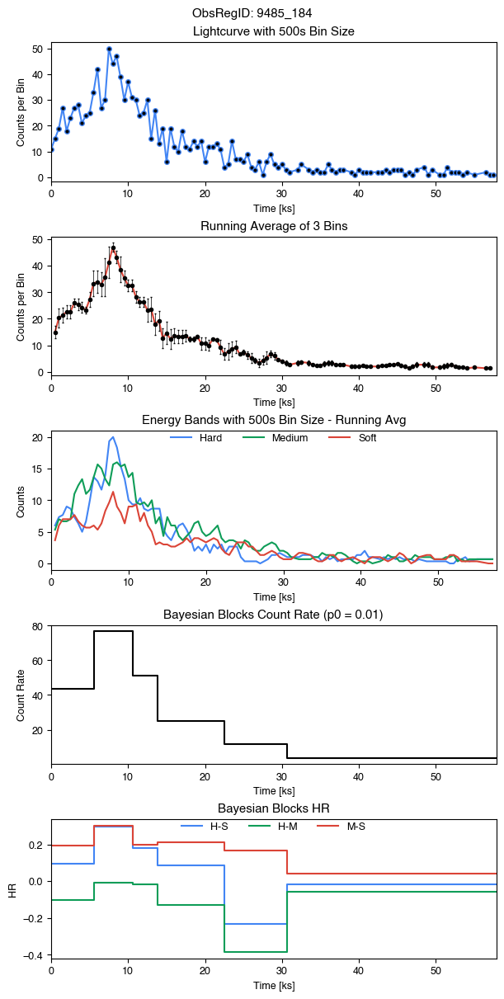

977_509
Source:  2CXO J180400.1-241925
ID: 977-509
Counts:  788
Observation Date:  2001-06-18T11:59:44


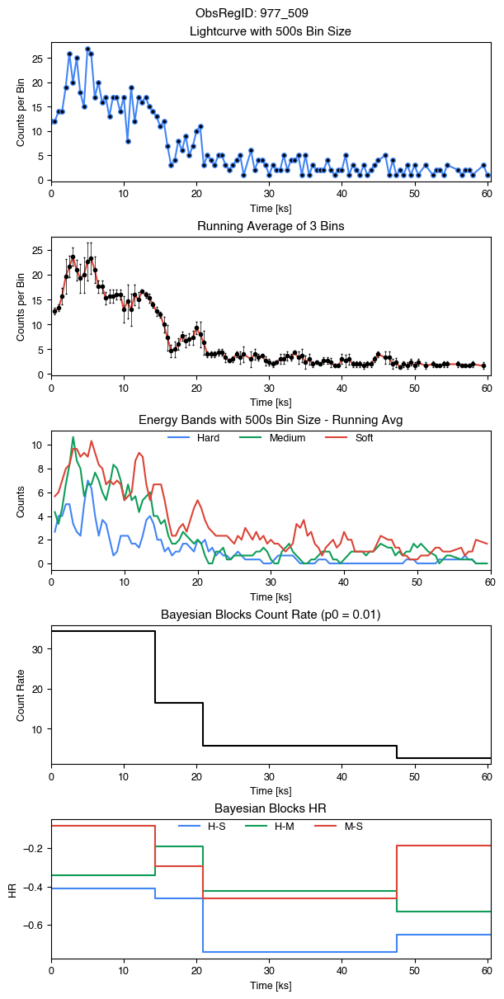

In [22]:
####
# df_properties_anomalies = df_properties_anomalies2 # comment out for clusters
# df_select = points_in_box# comment out for clusters
potential_anomalies = df_properties_anomalies['obsreg_id']
potential_anomalies = df_select['obsreg_id']
print(len(potential_anomalies))
keep = potential_anomalies.values[0:]

# keep = ['13814_86','2540_253','633_2117']
# keep = ['6442_37','11231_250','5424_145','16000_221']
# keep = ['3012_53','3744_830','4373_662','4396_2625','13117_169','13653_40','6291_253']
# keep = ['12330_2071','10135_343','11073_116','11073_116','13951_16']
# keep = potential_anomalies.values
# keep = ['9912_482']
years = range(1999,2023)
# Image producer
# keep = all_ids[50000:55000]
df_eventfiles_group_filtered = df_eventfiles_group.filter(lambda x: x.name in keep).groupby('obsreg_id')
for id_name, dfi in df_eventfiles_group_filtered:
    dfi.sort_values(by='time', inplace = True) 
    dfi.reset_index(drop=True, inplace = True)
    obsid = id_name.split("_")[0]
    regionid = id_name.split("_")[1]
    # Get property columns
    name = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].name.values[0]
    ra = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].ra.values[0]
    dec = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].dec.values[0]
    date = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].gti_obs.values[0] 
    # Get spectrum
    # pha_filename = [spec for spec in glob.iglob(f'{pha_folder}/acisf*pha3.fits.gz') if str(obsid) in spec and str(regionid) in spec][0]
    # ui.load_pha(pha_filename)
    # ui.ignore('0.:0.5,8.0:')
    # ui.subtract()
    # ui.notice_id(1,0.3,7.)
    # ui.group_counts(10)
    # ui.set_ylog()
    # ui.set_xlog()
    # ui.plot_data(color='red')
    # plt.xlim(1E-1,10)  
    # plt.show(

    if any(str(year) in date for year in years):
        print('Source: ', name)
        print(f'ID: {obsid}-{regionid}')
        print('Counts: ', len(dfi))
        print('Observation Date: ', date)
        lightcurveplotterNEW(dfi,id_name,500,bb_p0=0.01,band_errors=False)
    else:
        pass
    # # hist2D(dfi,id_name,16,24,'minmax',True,'plasma',lognorm=True)
    # # hist2D(dfi,id_name,16,24,'minmax',True,'plasma',lognorm=False)
    # hist3D(dfi,id_name,16,24,24,'minmax',True,'plasma',lognorm=True)
    #hist3D(dfi,id_name,16,24,24,'minmax',True,'plasma',lognorm=False)
    # hist3Dlog(dfi,id_name,16,24,24,'minmax',True,'plasma')

In [65]:
potential_anomalies = df_properties_anomalies['obsreg_id']
df_properties_anomalies = df_properties_global[df_properties_global['obsreg_id'].isin(potential_anomalies)]
# keep = ['13814_86','2540_253','633_2117']
keep = ['4373_704','17196_22']
keep = potential_anomalies
keep = ['4373_704','17196_22','5322_229']
df_properties_anomalies = df_properties_global[df_properties_global['obsreg_id'].isin(keep)]
df_properties_anomalies.head(500)

,name,ra,dec,err_ellipse_r0,err_ellipse_r1,err_ellipse_ang,significance,likelihood_class,conf_flag,sat_src_flag,...,hard_hs_hilim,var_prob_b,var_prob_h,var_prob_m,var_prob_s,var_index_b,var_index_w,livetime,detector,obsreg_id
33394,2CXO J053524.1-052132,83.850449,-5.359066,0.711036,0.710252,98.802834,37.030891,TRUE,False,False,...,-0.347908,1.0,1.000000,1.000000,1.000000,10.0,NaN,171465.489393,ACIS-3,4373_704
77440,2CXO J131531.7-162723,198.882148,-16.456599,0.710691,0.710518,158.198352,50.785932,TRUE,False,False,...,-0.883823,1.0,1.000000,1.000000,1.000000,10.0,NaN,88865.338014,ACIS-6,17196_22
84683,2CXO J140414.2+542604,211.059111,54.434571,0.711382,0.710545,58.332784,72.109780,TRUE,True,False,...,-0.576515,1.0,0.163951,0.841169,0.117768,8.0,NaN,64696.624674,ACIS-8,5322_229


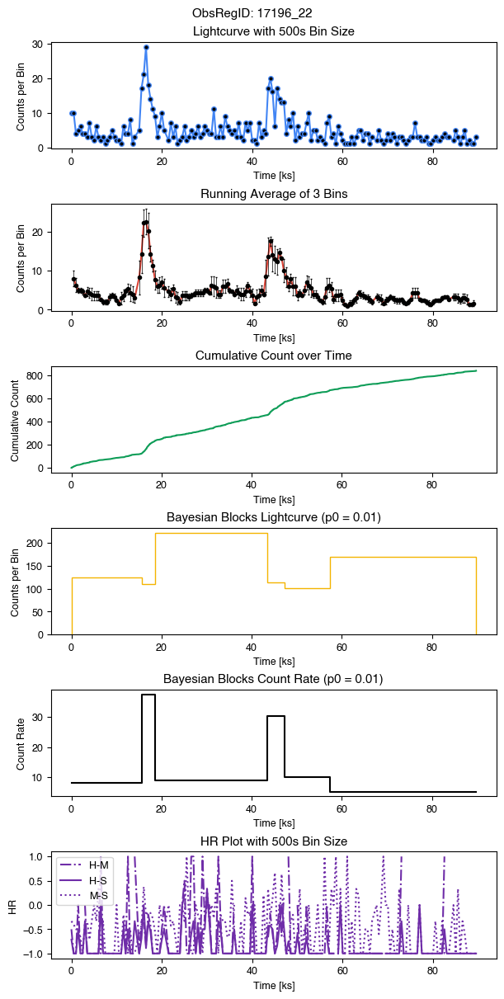

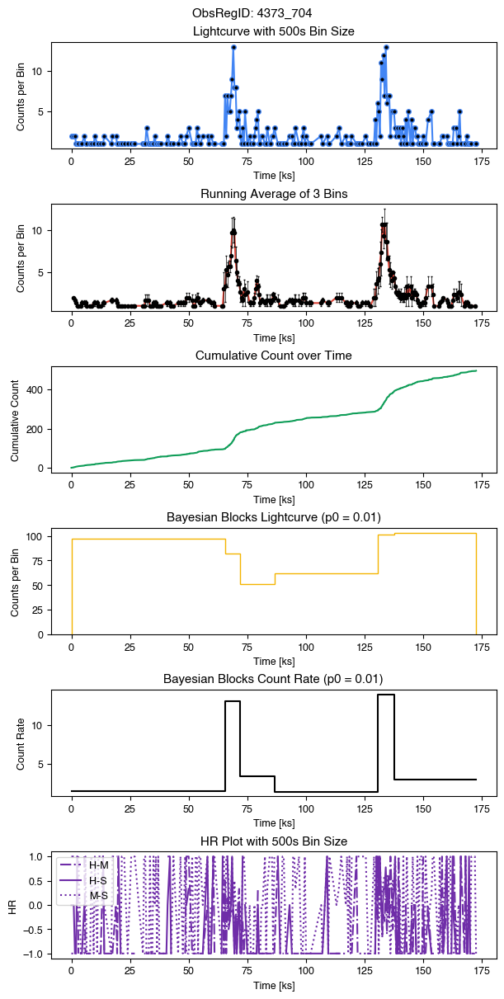

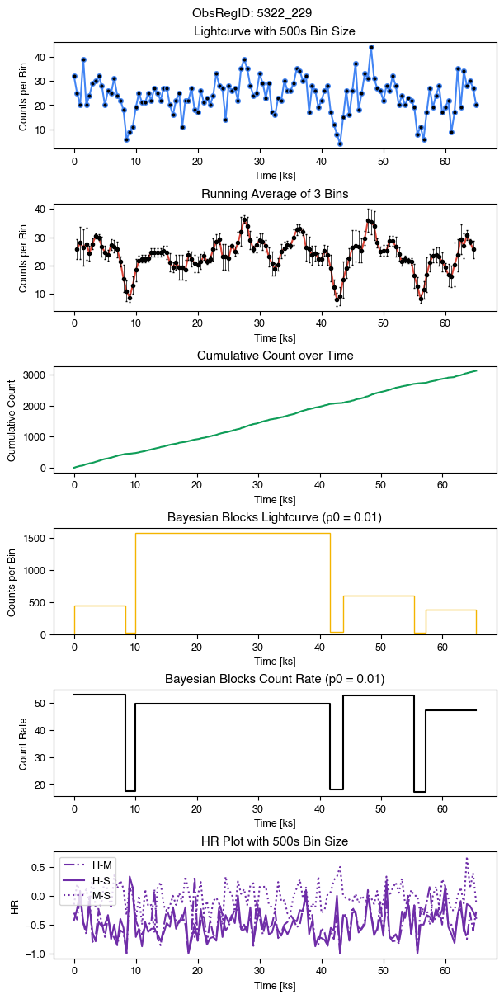

In [66]:
df_eventfiles_group_filtered = df_eventfiles_group.filter(lambda x: x.name in keep).groupby('obsreg_id')
for id_name, dfi in df_eventfiles_group_filtered:
    dfi.sort_values(by='time', inplace = True) 
    dfi.reset_index(drop=True, inplace = True)
    lightcurveplotter(dfi,id_name,500,bb_p0=0.01)